# PART ONE

# 1. Import and warehouse data:

In [1]:
#Import all the necessary modules
import pandas as pd
import numpy as np
import os
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import AgglomerativeClustering 
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as shc
import warnings # to ignore warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split

# To calculate the accuracy score of the model
from sklearn.metrics import accuracy_score, confusion_matrix

from sklearn.svm import SVC      
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

import time
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
p1data_1 = pd.read_json(r'C:\Users\ascd0\Downloads\Part1 - Car-Attributes.json')
p1data_2 = pd.read_csv(r'C:\Users\ascd0\Downloads\Part1 - Car name.csv')

In [3]:
p1data_1.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


In [4]:
p1data_2.head()

,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


In [5]:
print(p1data_1.shape)
print(p1data_2.shape)

(398, 8)
(398, 1)


In [6]:
print(p1data_1.size)
print(p1data_2.size)

3184
398


In [7]:
p1data=pd.concat([p1data_1,p1data_2],axis=1)

In [8]:
p1data.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


In [9]:
print("shape is",p1data.shape)
print("size is ",p1data.size)

shape is (398, 9)
size is  3582


In [10]:
# Export the data for future use
p1data.to_json(r'C:\Users\ascd0\Downloads\cardata_json.json')
p1data.to_csv(r'C:\Users\ascd0\Downloads\cardata_csv.csv', index=False)
p1data.to_excel(r'C:\Users\ascd0\Downloads\cardata_xls.xls', index=False)

In [11]:
#read data from local stored files
p1data_csv = pd.read_csv(r'C:\Users\ascd0\Downloads\cardata_csv.csv')
p1data_json = pd.read_json(r'C:\Users\ascd0\Downloads\cardata_json.json')
p1data_xls = pd.read_excel(r'C:\Users\ascd0\Downloads\cardata_xls.xls')

In [12]:
print(f'shape of csv file is{p1data_csv.shape} and size is {p1data_csv.size}')
print(f'shape of json file is{p1data_json.shape} and size is {p1data_json.size}')
print(f'shape of xls file is{p1data_xls.shape} and size is {p1data_xls.size}')

shape of csv file is(398, 9) and size is 3582
shape of json file is(398, 9) and size is 3582
shape of xls file is(398, 9) and size is 3582


In [13]:
p1data_xls.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


In [14]:
p1data_json.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


In [15]:
p1data_csv.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


# Data cleaning:

In [10]:
p1data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   mpg       398 non-null    float64
 1   cyl       398 non-null    int64  
 2   disp      398 non-null    float64
 3   hp        398 non-null    object 
 4   wt        398 non-null    int64  
 5   acc       398 non-null    float64
 6   yr        398 non-null    int64  
 7   origin    398 non-null    int64  
 8   car_name  398 non-null    object 
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


hp(horse power) holds float data but given as object...Need to be converted

In [11]:
p1data.describe(include=object).T

,count,unique,top,freq
hp,398,94,150,22
car_name,398,305,ford pinto,6


In [12]:
p1data.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0
origin,398.0,1.572864,0.802055,1.0,1.000,1.0,2.000,3.0


In [13]:
# Check for missing value
p1data.isna().sum()

mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
car_name    0
dtype: int64

In [14]:
for i in p1data.columns:
    print(f"unique {i} values :")
    print(f"{p1data[i].unique()}\n")

unique mpg values :
[18.  15.  16.  17.  14.  24.  22.  21.  27.  26.  25.  10.  11.   9.
 28.  19.  12.  13.  23.  30.  31.  35.  20.  29.  32.  33.  17.5 15.5
 14.5 22.5 24.5 18.5 29.5 26.5 16.5 31.5 36.  25.5 33.5 20.5 30.5 21.5
 43.1 36.1 32.8 39.4 19.9 19.4 20.2 19.2 25.1 20.6 20.8 18.6 18.1 17.7
 27.5 27.2 30.9 21.1 23.2 23.8 23.9 20.3 21.6 16.2 19.8 22.3 17.6 18.2
 16.9 31.9 34.1 35.7 27.4 25.4 34.2 34.5 31.8 37.3 28.4 28.8 26.8 41.5
 38.1 32.1 37.2 26.4 24.3 19.1 34.3 29.8 31.3 37.  32.2 46.6 27.9 40.8
 44.3 43.4 36.4 44.6 40.9 33.8 32.7 23.7 23.6 32.4 26.6 25.8 23.5 39.1
 39.  35.1 32.3 37.7 34.7 34.4 29.9 33.7 32.9 31.6 28.1 30.7 24.2 22.4
 34.  38.  44. ]

unique cyl values :
[8 4 6 3 5]

unique disp values :
[307.  350.  318.  304.  302.  429.  454.  440.  455.  390.  383.  340.
 400.  113.  198.  199.  200.   97.  110.  107.  104.  121.  360.  140.
  98.  232.  225.  250.  351.  258.  122.  116.   79.   88.   71.   72.
  91.   97.5  70.  120.   96.  108.  155.   68.  114. 

In [15]:
#From above we can see hp column is having few ? marks in data

In [16]:
p1data[p1data['hp']=="?"]

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
32,25.0,4,98.0,?,2046,19.0,71,1,ford pinto
126,21.0,6,200.0,?,2875,17.0,74,1,ford maverick
330,40.9,4,85.0,?,1835,17.3,80,2,renault lecar deluxe
336,23.6,4,140.0,?,2905,14.3,80,1,ford mustang cobra
354,34.5,4,100.0,?,2320,15.8,81,2,renault 18i
374,23.0,4,151.0,?,3035,20.5,82,1,amc concord dl


In [17]:
#Replace ? with nan
p1data['hp'].replace("?",np.nan, inplace=True)

In [18]:
p1data.isna().sum()

mpg         0
cyl         0
disp        0
hp          6
wt          0
acc         0
yr          0
origin      0
car_name    0
dtype: int64

In [19]:
#removing the missing values rows and correcting the hp datatype
p1data.dropna(inplace=True)
p1data['hp'] = p1data['hp'].astype('float')

In [20]:
p1data.car_name.nunique()

301

In [21]:
#out of 392 rows we have 301 uniqe car name. this column will not be mcuh useful in predticing. Lets remove it
p1data.drop('car_name',axis=1,inplace=True)

# Data analysis & visualisation

In [22]:
p1data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 392 entries, 0 to 397
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     392 non-null    float64
 1   cyl     392 non-null    int64  
 2   disp    392 non-null    float64
 3   hp      392 non-null    float64
 4   wt      392 non-null    int64  
 5   acc     392 non-null    float64
 6   yr      392 non-null    int64  
 7   origin  392 non-null    int64  
dtypes: float64(4), int64(4)
memory usage: 27.6 KB


In [23]:
p1data.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,392.0,23.445918,7.805007,9.0,17.000,22.75,29.000,46.6
cyl,392.0,5.471939,1.705783,3.0,4.000,4.00,8.000,8.0
disp,392.0,194.411990,104.644004,68.0,105.000,151.00,275.750,455.0
hp,392.0,104.469388,38.491160,46.0,75.000,93.50,126.000,230.0
wt,392.0,2977.584184,849.402560,1613.0,2225.250,2803.50,3614.750,5140.0
acc,392.0,15.541327,2.758864,8.0,13.775,15.50,17.025,24.8
yr,392.0,75.979592,3.683737,70.0,73.000,76.00,79.000,82.0
origin,392.0,1.576531,0.805518,1.0,1.000,1.00,2.000,3.0


In [24]:
# mpg - HIghest mpg is 46.6 and min is 9.0 average mpg across all types of cars is 23.44
# cyl - min cyl is 3 and max cyl is 8. Avg cyl value is 5.4. 75% value and 100% values are same.Seems most cars are in range of 4 to 8
# hp - Min hp of cars is 46.0 and max is 230 . Average hp of cars is 104.46
# wt - min wt of cars is 1613.0 and max is 5140. Average wt of cars is 2977.5 . 50% value and avg value are little close thatSeems we have all range wt cars in our data.
# acc - min acc of cars 8.0 and max is 24.8 Average acc of cars is 15.5
# yr - min year car model is 70 and max year is 82.0. Can compute model age with year vlaue that will be useful in evaluation
# origin - unique origin values are 1, 2 and 3.

In [25]:
p1data.median()

mpg         22.75
cyl          4.00
disp       151.00
hp          93.50
wt        2803.50
acc         15.50
yr          76.00
origin       1.00
dtype: float64

if the mean is Greater than mode or median then data is positively skewed. if the mean is lower then mode or meadian then data is negatively skewed

From Mean and median not able to figure the exact skewness.

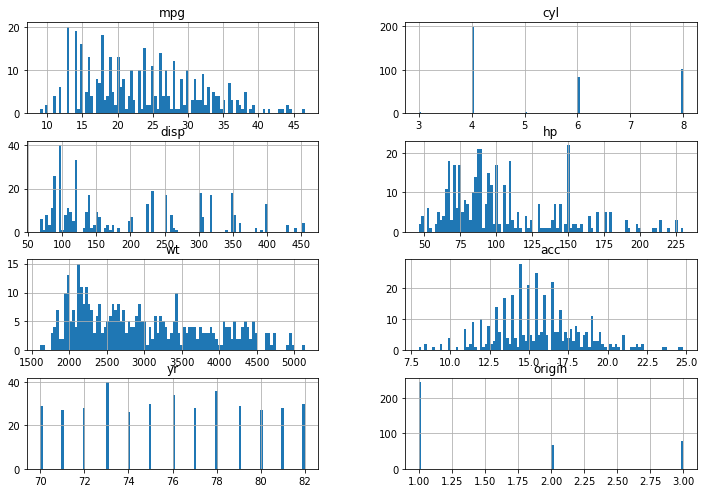

In [26]:
columns = list(p1data) 
p1data[columns].hist(stacked=False, bins=100, figsize=(12,30), layout=(14,2)); 

In [27]:
#mpg - Most cars have mpg range of 12 to 36(approx). Few cars have mpg less than 10 and few have more than 40.
#cyl - 4 cyl cars are more compared to others
#hp - Most cars have Hp values of 60 to 110. 150 hp cars are high compared to others
#wt - most cars ranged in between 2000 to 3500 and few cars have wieght more than 5000
#acc - Data seems normally distributed 
# origin - origin 1 data are more than compared to others

In [28]:
p1data.columns

Index(['mpg', 'cyl', 'disp', 'hp', 'wt', 'acc', 'yr', 'origin'], dtype='object')

<AxesSubplot:>

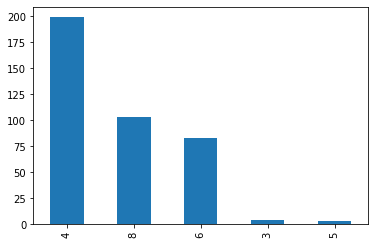

In [29]:
pd.value_counts(p1data["cyl"]).plot(kind="bar")

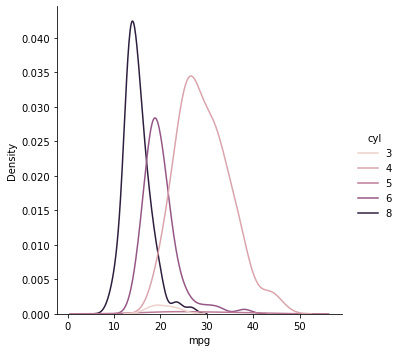

In [30]:
sns.displot(x='mpg',data=p1data,hue='cyl',kind='kde')

In [31]:
#from above above displot we can claearly see mpg is very high for 4 cyl cars

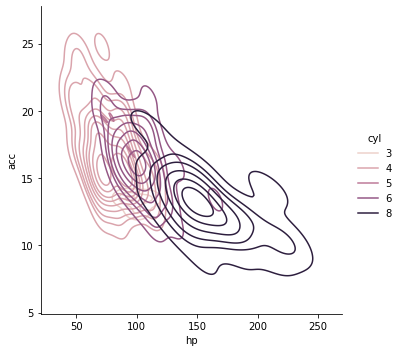

In [32]:
sns.displot(x='hp',y='acc',data=p1data,hue='cyl',kind='kde')

In [33]:
#hp and acc of car are very high with 8 cyl

<AxesSubplot:xlabel='wt', ylabel='mpg'>

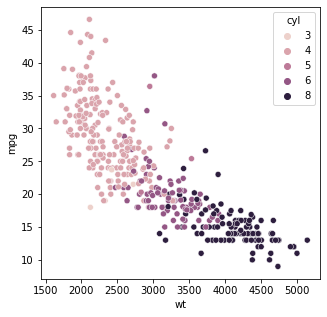

In [34]:
fig, ax =plt.subplots(figsize=(5,5))
sns.scatterplot(y=p1data['mpg'] , x=p1data['wt'],data=p1data,hue=p1data['cyl'],ax=ax)

In [35]:
#from above we can interpret 8 cyl are used more with high weight cars and mpg are less with high weight cars.
#as predicted above 4 cyl cars are giving high mpg 

<AxesSubplot:xlabel='wt', ylabel='mpg'>

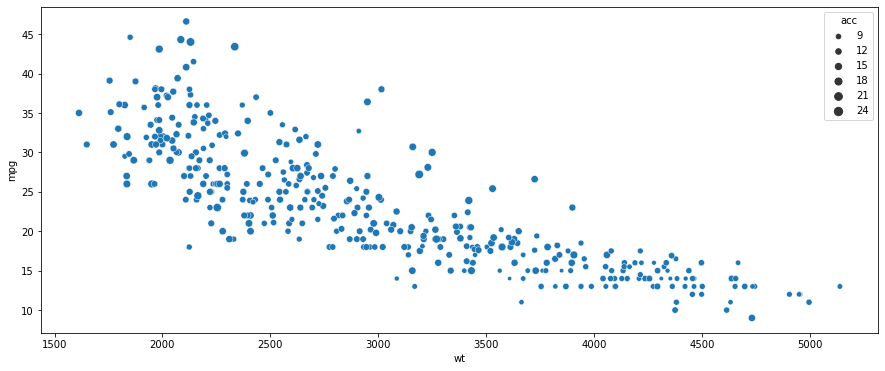

In [36]:
fig, ax =plt.subplots(figsize=(15,6))
sns.scatterplot(y=p1data['mpg'] , x=p1data['wt'],data=p1data,size=p1data['acc'],ax=ax)

In [37]:
#from above we can interpret it seems high weight cars dont have high acceleration

<AxesSubplot:xlabel='wt', ylabel='hp'>

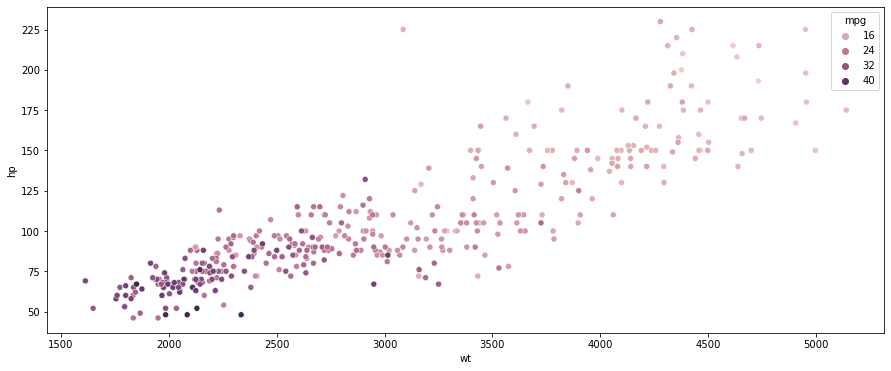

In [38]:
fig, ax =plt.subplots(figsize=(15,6))
sns.scatterplot(y=p1data['hp'] , x=p1data['wt'],data=p1data,hue=p1data['mpg'],ax=ax)

In [39]:
#high weight cars with more hp are not giving high mpg. Low weight cars with less hp are giving are max mpg.

<AxesSubplot:>

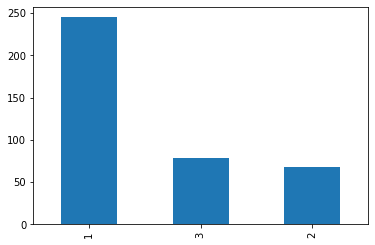

In [40]:
pd.value_counts(p1data["origin"]).plot(kind="bar")

In [41]:
#seems like more cars manufcatured at origin 1. origin 2 and 3 have approx equal production

<AxesSubplot:>

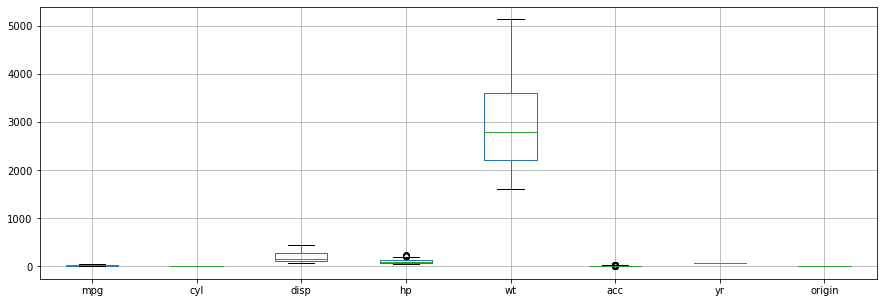

In [42]:
p1data.boxplot(figsize=(15,5))

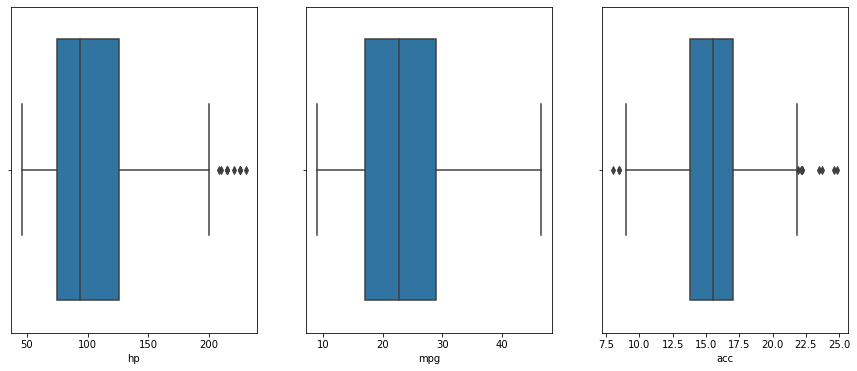

In [43]:
count=1
list=['hp','mpg','acc']
plt.subplots(figsize=(15, 6))
for col in list:
    plt.subplot(1,3,count)
    sns.boxplot(x=p1data[col])
    count+=1

plt.show()

In [44]:
#Seems like hp and acc are having outliers. Need to normalize the data

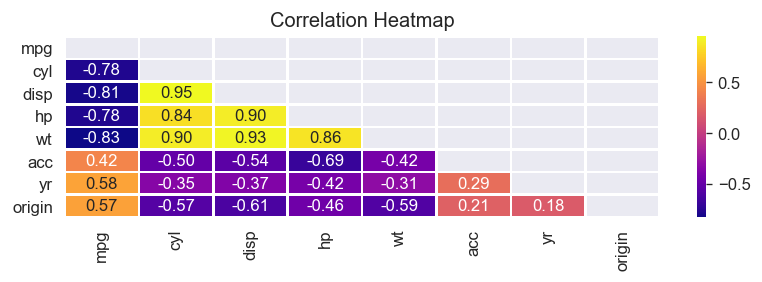

In [45]:
sns.set_style('darkgrid')
plt.figure(dpi = 120,figsize= (8,2))
mask = np.triu(np.ones_like(p1data.corr(),dtype = bool))
sns.heatmap(p1data.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'plasma')
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.title('Correlation Heatmap')
plt.show()

#From above we can observe mpg is negatviely correalting with cyl disp hp and wt.
cyl is highly postive correlateing with wt hp and disp where as negativly correlating with acc and origin
disp is positively correlating with hp and wt where as correlating negatively with acc and origin

<Figure size 720x480 with 0 Axes>

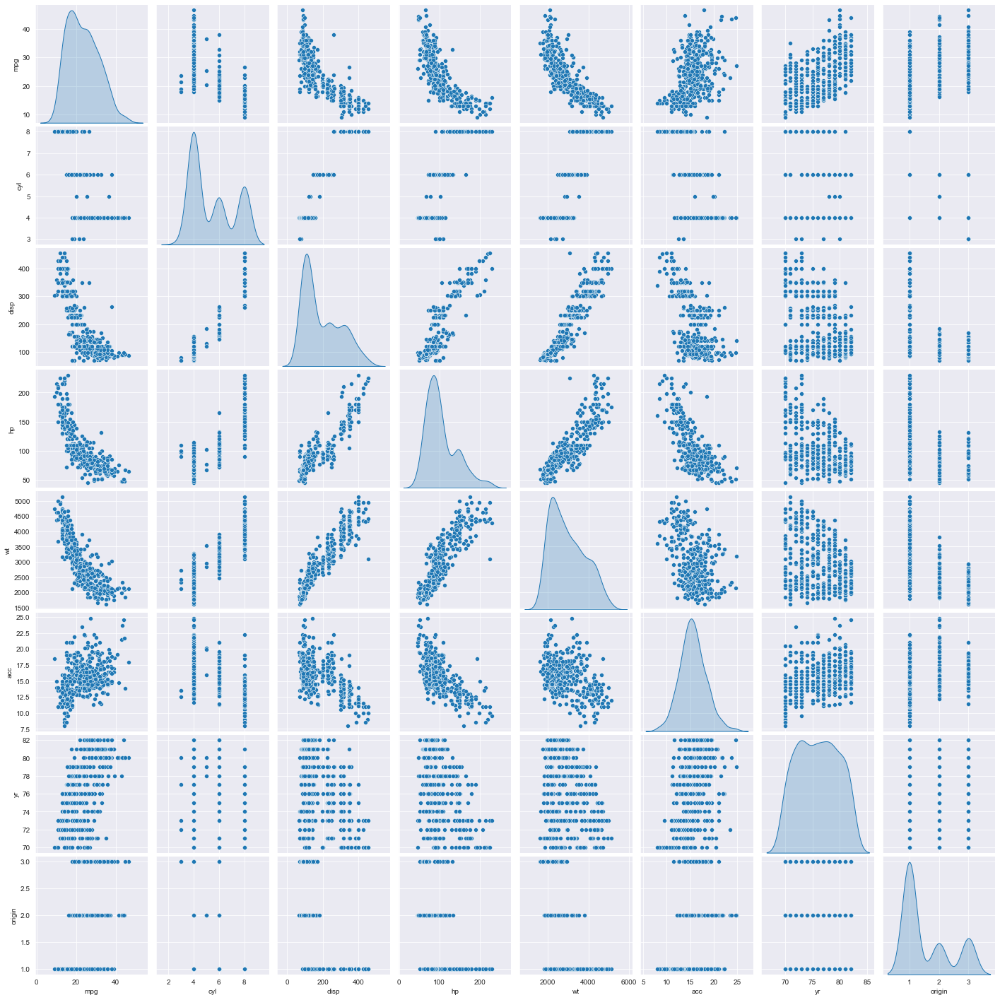

In [46]:
plt.figure(dpi=120)
sns.pairplot(p1data,diag_kind='kde')
plt.show()

In [47]:
#as predcited from correaltion few varaibles are correlating negatively with other varibles and positively with few variables.
#wt origin and disp are showing 3 peaks
#acc and yr looks to be normally distributed

#observations
 hp and acc of car are very high with 8 cyl.8 cyl are used more with high weight cars and mpg is less with high weight cars.
 4 cyl cars are giving high mpg 
 high weight cars with more hp are not giving high mpg. Low weight cars with less hp are giving are max mpg
 
 with model year we can compute age of car whcih will be used in predictions. Max year model is 82. model may come into market by year 83. so will subtract year from 83 to get age of model.
 
 as predicted origin1 is producing max cars. we can use dummies to create columns for orgion 1,2 and 3.
 
 hp and acc are having outliers. Need to normalize the data

In [48]:
# compute age of model
p1data['age'] = 83-p1data['yr']
p1data.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,age
0,18.0,8,307.0,130.0,3504,12.0,70,1,13
1,15.0,8,350.0,165.0,3693,11.5,70,1,13
2,18.0,8,318.0,150.0,3436,11.0,70,1,13
3,16.0,8,304.0,150.0,3433,12.0,70,1,13
4,17.0,8,302.0,140.0,3449,10.5,70,1,13


In [49]:
p1datax=p1data.copy()

In [50]:
p1data.origin.unique()

array([1, 3, 2], dtype=int64)

In [51]:
p1data = pd.get_dummies(p1data, columns=['origin'])
p1data.head()

,mpg,cyl,disp,hp,wt,acc,yr,age,origin_1,origin_2,origin_3
0,18.0,8,307.0,130.0,3504,12.0,70,13,1,0,0
1,15.0,8,350.0,165.0,3693,11.5,70,13,1,0,0
2,18.0,8,318.0,150.0,3436,11.0,70,13,1,0,0
3,16.0,8,304.0,150.0,3433,12.0,70,13,1,0,0
4,17.0,8,302.0,140.0,3449,10.5,70,13,1,0,0


In [52]:
#as we determined age of model...lets delete yr column
p1data.drop('yr',axis=1,inplace=True)

# standardize data

In [53]:
# apply log transform for hp and acc to remove outliers
p1data['hp'] = np.log(p1data['hp'])
p1data['acc'] = np.log(p1data['acc'])

p1data.head()

,mpg,cyl,disp,hp,wt,acc,age,origin_1,origin_2,origin_3
0,18.0,8,307.0,4.867534,3504,2.484907,13,1,0,0
1,15.0,8,350.0,5.105945,3693,2.442347,13,1,0,0
2,18.0,8,318.0,5.010635,3436,2.397895,13,1,0,0
3,16.0,8,304.0,5.010635,3433,2.484907,13,1,0,0
4,17.0,8,302.0,4.941642,3449,2.351375,13,1,0,0


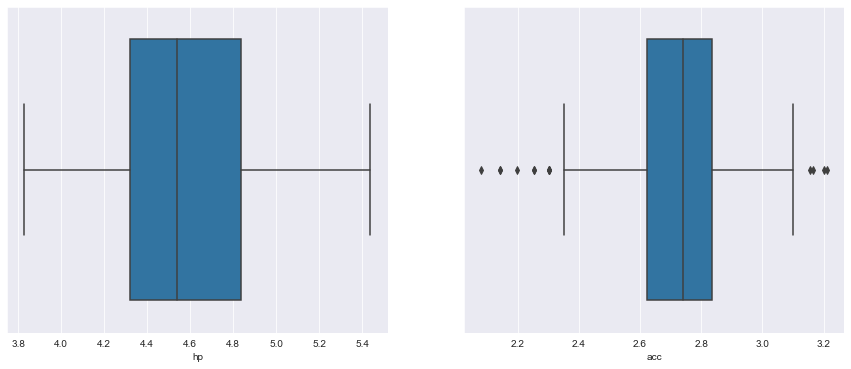

In [54]:
count=1
list=['hp','acc']
plt.subplots(figsize=(15, 6))
for col in list:
    plt.subplot(1,2,count)
    sns.boxplot(x=p1data[col])
    count+=1

plt.show()

In [55]:
#outliers are reduced and looks better...lets take backup 
p1data_new = p1data.copy()
p1data_new.head(5)

,mpg,cyl,disp,hp,wt,acc,age,origin_1,origin_2,origin_3
0,18.0,8,307.0,4.867534,3504,2.484907,13,1,0,0
1,15.0,8,350.0,5.105945,3693,2.442347,13,1,0,0
2,18.0,8,318.0,5.010635,3436,2.397895,13,1,0,0
3,16.0,8,304.0,5.010635,3433,2.484907,13,1,0,0
4,17.0,8,302.0,4.941642,3449,2.351375,13,1,0,0


# Machine learning: K-Means

In [56]:
from scipy.stats import zscore
p1data_scaled=p1data.apply(zscore)
p1data_scaled.head(5)

,mpg,cyl,disp,hp,wt,acc,age,origin_1,origin_2,origin_3
0,-0.698638,1.483947,1.077290,0.815310,0.620540,-1.342270,1.625315,0.774597,-0.458123,-0.50239
1,-1.083498,1.483947,1.488732,1.510507,0.843334,-1.577764,1.625315,0.774597,-0.458123,-0.50239
2,-0.698638,1.483947,1.182542,1.232586,0.540382,-1.823726,1.625315,0.774597,-0.458123,-0.50239
3,-0.955212,1.483947,1.048584,1.232586,0.536845,-1.342270,1.625315,0.774597,-0.458123,-0.50239
4,-0.826925,1.483947,1.029447,1.031406,0.555706,-2.081133,1.625315,0.774597,-0.458123,-0.50239


Text(0.5, 1.0, 'Selecting k with the Elbow Method')

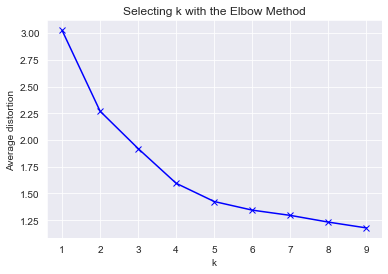

In [57]:
#Finding optimal no. of clusters
from scipy.spatial.distance import cdist
clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(p1data_scaled)
    prediction=model.predict(p1data_scaled)
    meanDistortions.append(sum(np.min(cdist(p1data_scaled, model.cluster_centers_, 'euclidean'), axis=1)) / p1data_scaled.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

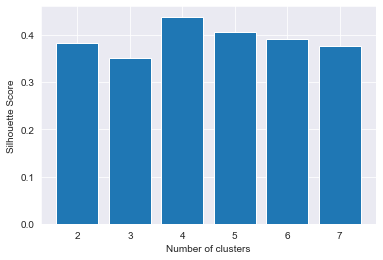

In [58]:
# silhouette analysis
from sklearn.metrics import silhouette_score

silhouette_scores = [] 

for n_cluster in range(2, 8):
    silhouette_scores.append( 
        silhouette_score(p1data_scaled, KMeans(n_clusters = n_cluster,max_iter=1000).fit_predict(p1data_scaled))) 
    
# Plotting a bar graph to compare the results 
k = [2, 3, 4, 5, 6,7] 
plt.bar(k, silhouette_scores) 
plt.xlabel('Number of clusters', fontsize = 10) 
plt.ylabel('Silhouette Score', fontsize = 10) 
plt.show() 

In [59]:
#from above we can decide optimal cluster as 4

In [60]:
#  K = 4

start =time.time()
final_model=KMeans(4)
final_model.fit(p1data_scaled)
prediction=final_model.predict(p1data_scaled)
end =time.time()
duration = end-start
print("Duration taken is ",duration)

Duration taken is  0.14398670196533203


In [61]:
#Append the prediction 
p1data["GROUP"] = prediction
p1data_scaled["GROUP"] = prediction
print("Groups Assigned : \n")
p1data.head()

Groups Assigned : 



,mpg,cyl,disp,hp,wt,acc,age,origin_1,origin_2,origin_3,GROUP
0,18.0,8,307.0,4.867534,3504,2.484907,13,1,0,0,1
1,15.0,8,350.0,5.105945,3693,2.442347,13,1,0,0,1
2,18.0,8,318.0,5.010635,3436,2.397895,13,1,0,0,1
3,16.0,8,304.0,5.010635,3433,2.484907,13,1,0,0,1
4,17.0,8,302.0,4.941642,3449,2.351375,13,1,0,0,1


In [62]:
# Check the number of data in each cluster

p1data_scaled.GROUP.value_counts(ascending=True)

3     68
2     79
1    100
0    145
Name: GROUP, dtype: int64

In [63]:
#Lets Analyze the distribution of the data with box plot
p1data_clust = p1data.groupby(['GROUP'])
p1data_clust.mean()

,mpg,cyl,disp,hp,wt,acc,age,origin_1,origin_2,origin_3
GROUP,,,,,,,,,,
0,23.701379,5.103448,179.334483,4.492307,2852.200000,2.798909,6.137931,1,0,0
1,14.715000,7.980000,346.370000,5.065922,4126.910000,2.532525,9.250000,1,0,0
2,30.450633,4.101266,102.708861,4.356344,2221.227848,2.775970,5.556962,0,0,1
3,27.602941,4.161765,109.632353,4.357960,2433.470588,2.805586,7.323529,0,1,0


array([[<AxesSubplot:title={'center':'acc'}, xlabel='[GROUP]'>,
        <AxesSubplot:title={'center':'age'}, xlabel='[GROUP]'>,
        <AxesSubplot:title={'center':'cyl'}, xlabel='[GROUP]'>,
        <AxesSubplot:title={'center':'disp'}, xlabel='[GROUP]'>,
        <AxesSubplot:title={'center':'hp'}, xlabel='[GROUP]'>],
       [<AxesSubplot:title={'center':'mpg'}, xlabel='[GROUP]'>,
        <AxesSubplot:title={'center':'origin_1'}, xlabel='[GROUP]'>,
        <AxesSubplot:title={'center':'origin_2'}, xlabel='[GROUP]'>,
        <AxesSubplot:title={'center':'origin_3'}, xlabel='[GROUP]'>,
        <AxesSubplot:title={'center':'wt'}, xlabel='[GROUP]'>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

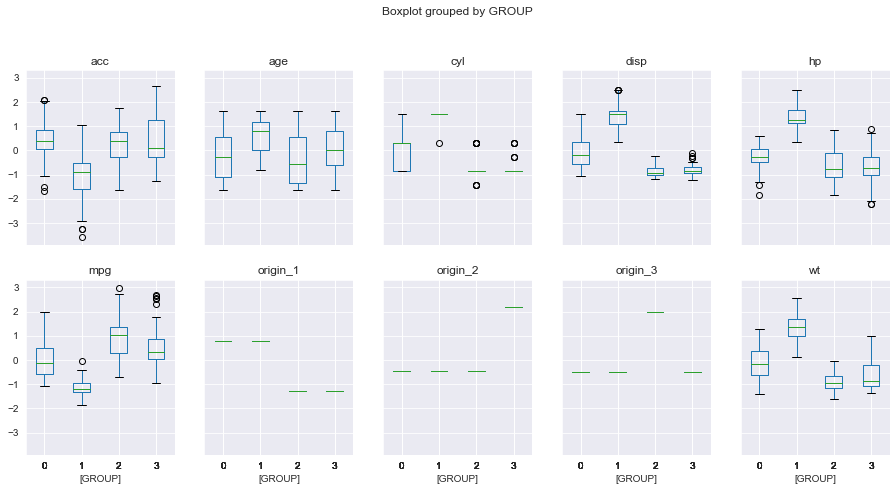

In [64]:
p1data_scaled.boxplot(by='GROUP', layout = (3,5),figsize=(15,11))

#Group1 - Cars giving high mpg classified as group1. using cyl as 4 and low hp and weight segemnt.from age it Seems to be these new cars and origins at 3.
#Group3 - Cars giving bit less mpg than group1. slightly higher hp acc and wt than group1.From age it seems slight oldest cars.
#Group0 - Cars having moderate weight and from age seems slightly older. Comparitively less  mpg than group1 & 3 and origins at 1.
#Group2 - High wt, hp, cyl ,disp and Less mpg and oldest cars origins at 1.

Group1 cars giving better performance.

# Hierarchial Clustering

In [65]:
#Lets copy data from backup and scale it to new df
p1data_hi = p1data_new.copy()

p1data_hi_scaled=p1data_hi.apply(zscore)
p1data_hi_scaled.head(5)

,mpg,cyl,disp,hp,wt,acc,age,origin_1,origin_2,origin_3
0,-0.698638,1.483947,1.077290,0.815310,0.620540,-1.342270,1.625315,0.774597,-0.458123,-0.50239
1,-1.083498,1.483947,1.488732,1.510507,0.843334,-1.577764,1.625315,0.774597,-0.458123,-0.50239
2,-0.698638,1.483947,1.182542,1.232586,0.540382,-1.823726,1.625315,0.774597,-0.458123,-0.50239
3,-0.955212,1.483947,1.048584,1.232586,0.536845,-1.342270,1.625315,0.774597,-0.458123,-0.50239
4,-0.826925,1.483947,1.029447,1.031406,0.555706,-2.081133,1.625315,0.774597,-0.458123,-0.50239


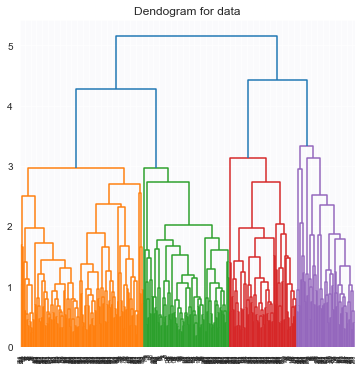

In [66]:
plt.figure(figsize =(6, 6)) 
plt.title('Dendogram for data') 
Dendrogram = shc.dendrogram((shc.linkage(p1data_hi_scaled, method ='average'))) 

In [67]:
#From above dendogram we can decide optimum number of clusters as 4

In [68]:
from sklearn.cluster import AgglomerativeClustering 
start =time.time()
model = AgglomerativeClustering(n_clusters=4, affinity='euclidean',  linkage='average')
model.fit(p1data_hi_scaled)
end =time.time()
duration = end-start
print("Duration taken is ",duration)

Duration taken is  0.08576416969299316


In [69]:
p1data_hi['labels'] = model.labels_
p1data_hi_scaled['labels'] = model.labels_
p1data_hi.head(5)

,mpg,cyl,disp,hp,wt,acc,age,origin_1,origin_2,origin_3,labels
0,18.0,8,307.0,4.867534,3504,2.484907,13,1,0,0,1
1,15.0,8,350.0,5.105945,3693,2.442347,13,1,0,0,1
2,18.0,8,318.0,5.010635,3436,2.397895,13,1,0,0,1
3,16.0,8,304.0,5.010635,3433,2.484907,13,1,0,0,1
4,17.0,8,302.0,4.941642,3449,2.351375,13,1,0,0,1


In [70]:
# Check the number of data in each cluster

p1data_hi_scaled.labels.value_counts(ascending=True)

0     68
2     79
1    100
3    145
Name: labels, dtype: int64

In [71]:
#Lets Analyze the distribution of the data with box plot
p1data_hi_clust = p1data_hi.groupby(['labels'])
p1data_hi_clust.mean()

,mpg,cyl,disp,hp,wt,acc,age,origin_1,origin_2,origin_3
labels,,,,,,,,,,
0,27.602941,4.161765,109.632353,4.357960,2433.470588,2.805586,7.323529,0,1,0
1,14.684000,7.980000,345.470000,5.064643,4121.560000,2.531369,9.260000,1,0,0
2,30.450633,4.101266,102.708861,4.356344,2221.227848,2.775970,5.556962,0,0,1
3,23.722759,5.103448,179.955172,4.493188,2855.889655,2.799706,6.131034,1,0,0


array([[<AxesSubplot:title={'center':'acc'}, xlabel='[labels]'>,
        <AxesSubplot:title={'center':'age'}, xlabel='[labels]'>,
        <AxesSubplot:title={'center':'cyl'}, xlabel='[labels]'>,
        <AxesSubplot:title={'center':'disp'}, xlabel='[labels]'>,
        <AxesSubplot:title={'center':'hp'}, xlabel='[labels]'>],
       [<AxesSubplot:title={'center':'mpg'}, xlabel='[labels]'>,
        <AxesSubplot:title={'center':'origin_1'}, xlabel='[labels]'>,
        <AxesSubplot:title={'center':'origin_2'}, xlabel='[labels]'>,
        <AxesSubplot:title={'center':'origin_3'}, xlabel='[labels]'>,
        <AxesSubplot:title={'center':'wt'}, xlabel='[labels]'>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

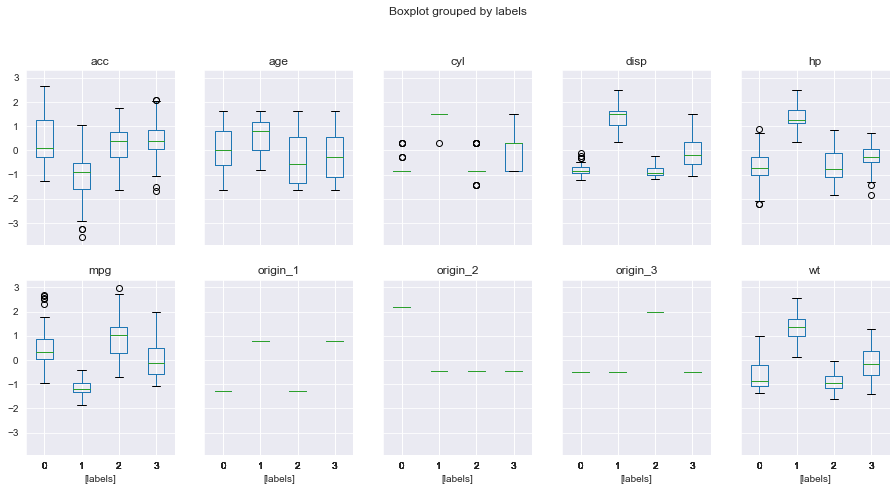

In [72]:
p1data_hi_scaled.boxplot(by='labels', layout = (3,5),figsize=(15,11))

#Group2 - Cars giving high mpg classified as group2. using cyl as 4 and low hp and weight segemnt.from age it Seems to be these new cars and origins at 3.
#Group0 - Cars giving bit less mpg than group2. slightly higher hp acc and wt than group1.From age it seems slight oldest cars.
#Group3 - Cars having moderate weight and from age seems slightly older. Comparitively less  mpg than group2 & 0 and origins at 1.
#Group1 - High wt, hp, cyl ,disp and Less mpg and oldest cars origins at 1.

Group2 cars giving better performance.

Applied both K-means & Hierarchial clustering and found clusters formed are identical.Even though names are different,characterstics are same

Not able to experiece much difference in execution as dataset was very small.

For K Means clustering we need prior knowledge of K i.e. no. of clusters we want to divide our data into. Using Elbow method and Silhouette Score determined optimal number of clusters. Where as, in hierarchical clustering decided the number of clusters by interpreting the dendrogram.

Based on execution time taken hierarchial model performed better.

# Use linear regression model on different clusters separately and print the coefficients of the models individually

In [73]:
p1data_new.head(5)

,mpg,cyl,disp,hp,wt,acc,age,origin_1,origin_2,origin_3
0,18.0,8,307.0,4.867534,3504,2.484907,13,1,0,0
1,15.0,8,350.0,5.105945,3693,2.442347,13,1,0,0
2,18.0,8,318.0,5.010635,3436,2.397895,13,1,0,0
3,16.0,8,304.0,5.010635,3433,2.484907,13,1,0,0
4,17.0,8,302.0,4.941642,3449,2.351375,13,1,0,0


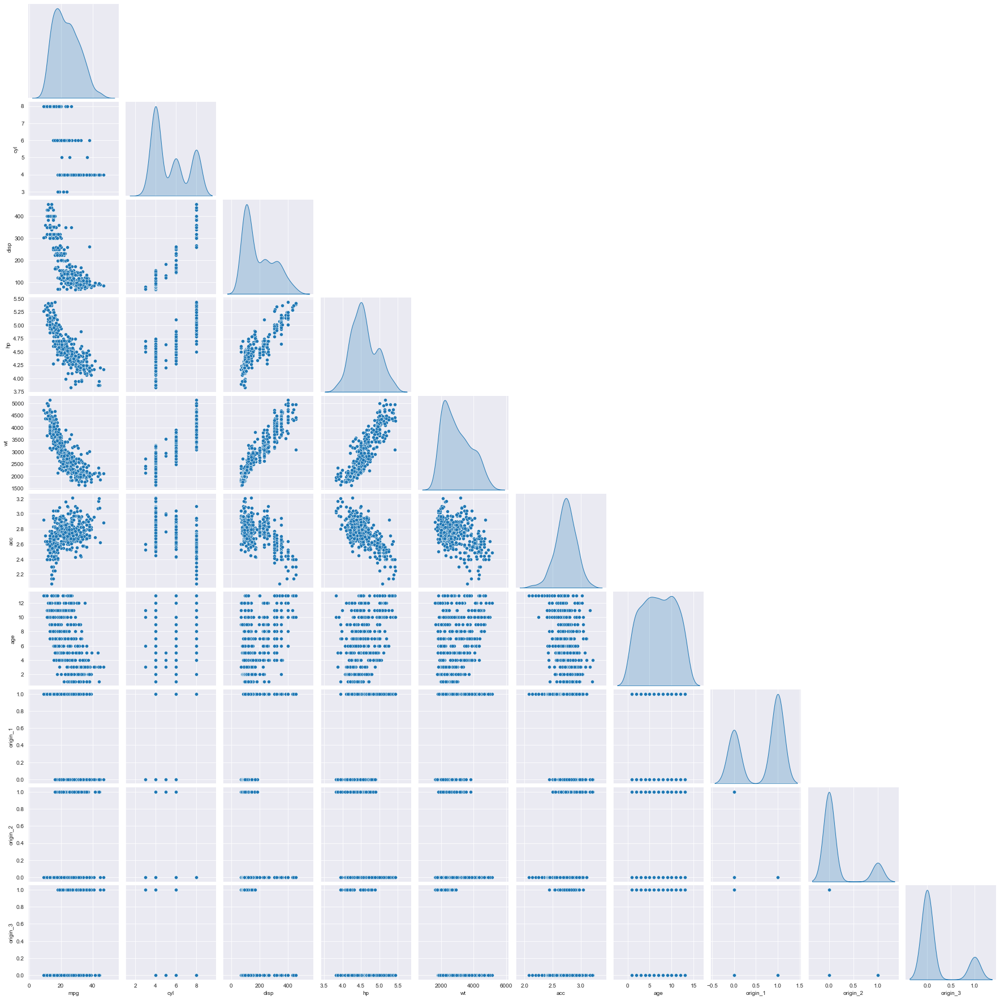

In [74]:
sns.pairplot(p1data_new,corner=True,diag_kind='kde')

In [75]:
#mpg is correlating negatively with other columns data and most predictor varaibles are non-linear

In [76]:
#lets apply linear regression on oroginal dataset
# independant variables
X = p1data_new.drop(['mpg'], axis=1)
# the dependent variable
y = p1data_new[['mpg']]

In [77]:
# Split X and y into training and test set in 70:30 ratio
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)

In [78]:
print('x_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('x_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)

x_train shape:  (274, 9)
y_train shape:  (274, 1)
x_test shape:  (118, 9)
y_test shape:  (118, 1)


In [79]:
#Fit Regression Model
from sklearn.linear_model import LinearRegression
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [80]:
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for cyl is -0.19851906648007359
The coefficient for disp is 0.01826808676935008
The coefficient for hp is -9.007023907849408
The coefficient for wt is -0.004583295331870816
The coefficient for acc is -3.3047689413132892
The coefficient for age is -0.7230894080999593
The coefficient for origin_1 is -1.6848706772605915
The coefficient for origin_2 is 0.5555844330937506
The coefficient for origin_3 is 1.1292862441668348


In [81]:
intercept = regression_model.intercept_[0]
print("The intercept for our model is {}".format(intercept))

print("R2 score for train set is",regression_model.score(X_train, y_train))
print("R2 score for test set is",regression_model.score(X_test, y_test))

The intercept for our model is 90.68648744122834
R2 score for train set is 0.8327255015790547
R2 score for test set is 0.8521961307863264


In [82]:
p1data.columns

Index(['mpg', 'cyl', 'disp', 'hp', 'wt', 'acc', 'age', 'origin_1', 'origin_2',
       'origin_3', 'GROUP'],
      dtype='object')

In [83]:
#Store the results for each in a dataframe for comparison
resultsDf = pd.DataFrame({'Type':['Base'],
                          'cyl': [regression_model.coef_[0][0]],
                          'disp':[regression_model.coef_[0][1]],
                          'hp':[regression_model.coef_[0][2]],
                          'wt':[regression_model.coef_[0][3]],
                          'acc': [regression_model.coef_[0][4]],
                          'age': [regression_model.coef_[0][5]],
                          'origin_1': [regression_model.coef_[0][6]],
                          'origin_2': [regression_model.coef_[0][7]],
                          'origin_3': [regression_model.coef_[0][8]],
                          'Intercept': [intercept],
                          'R2_train': [regression_model.score(X_train, y_train)],
                          'R2_test': [regression_model.score(X_test, y_test)]})
resultsDf = resultsDf[['Type', 'cyl', 'disp', 'hp', 'wt', 'acc', 'age', 'origin_1', 'origin_2',
       'origin_3','Intercept','R2_train','R2_test']]
resultsDf

,Type,cyl,disp,hp,wt,acc,age,origin_1,origin_2,origin_3,Intercept,R2_train,R2_test
0,Base,-0.198519,0.018268,-9.007024,-0.004583,-3.304769,-0.723089,-1.684871,0.555584,1.129286,90.686487,0.832726,0.852196


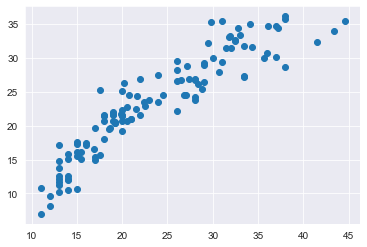

In [84]:
#Predictions from our Model
predictions = regression_model.predict(X_test)
plt.scatter(y_test,predictions)

# split the clusters into different datasets to apply LR

In [85]:
p1data.GROUP.value_counts()

0    145
1    100
2     79
3     68
Name: GROUP, dtype: int64

In [86]:
p1data_0=p1data[p1data.GROUP==0]
p1data_1=p1data[p1data.GROUP==1]
p1data_2=p1data[p1data.GROUP==2]
p1data_3=p1data[p1data.GROUP==3]

In [87]:
print('shape of p1data_0',p1data_0.shape)
print('shape of p1data_1',p1data_1.shape)
print('shape of p1data_2',p1data_2.shape)
print('shape of p1data_3',p1data_3.shape)

shape of p1data_0 (145, 11)
shape of p1data_1 (100, 11)
shape of p1data_2 (79, 11)
shape of p1data_3 (68, 11)


In [88]:
p1data_0.columns

Index(['mpg', 'cyl', 'disp', 'hp', 'wt', 'acc', 'age', 'origin_1', 'origin_2',
       'origin_3', 'GROUP'],
      dtype='object')

# Split X and y for all clusters

In [89]:
# independant variables
X_0 = p1data_0.drop(['mpg','GROUP'], axis=1)
# the dependent variable
y_0 = p1data_0[['mpg']]

X_1 = p1data_1.drop(['mpg','GROUP'], axis=1)
y_1 = p1data_1[['mpg']]

X_2 = p1data_2.drop(['mpg','GROUP'], axis=1)
y_2 = p1data_2[['mpg']]

X_3 = p1data_3.drop(['mpg','GROUP'], axis=1)
y_3 = p1data_3[['mpg']]

In [90]:
# Split X and y into training and test set in 70:30 ratio
from sklearn.model_selection import train_test_split
X_train_0, X_test_0, y_train_0, y_test_0 = train_test_split(X_0, y_0, test_size=0.30, random_state=1)
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(X_1, y_1, test_size=0.30, random_state=1)
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_2, y_2, test_size=0.30, random_state=1)
X_train_3, X_test_3, y_train_3, y_test_3 = train_test_split(X_3, y_3, test_size=0.30, random_state=1)

print(f'x_train_0 shape:{X_train_0.shape}  | y_train_0 shape:{y_train_0.shape} | X_test_0 shape:{X_test_0.shape} | X_test_0 shape:{X_train_0.shape}' )
print(f'x_train_1 shape:{X_train_1.shape} | y_train_1 shape:{y_train_1.shape}| X_test_1 shape:{X_test_1.shape} | X_test_1 shape:{X_train_1.shape}' )
print(f'x_train_2 shape:{X_train_2.shape}  | y_train_2 shape:{y_train_2.shape} | X_test_2 shape:{X_test_2.shape} | X_train_2 shape:{X_train_2.shape}' )
print(f'x_train_3 shape:{X_train_3.shape}  | y_train_3 shape:{y_train_3.shape} | X_test_3 shape:{X_test_3.shape} | X_train_3 shape:{X_train_3.shape}' )

x_train_0 shape:(101, 9)  | y_train_0 shape:(101, 1) | X_test_0 shape:(44, 9) | X_test_0 shape:(101, 9)
x_train_1 shape:(70, 9) | y_train_1 shape:(70, 1)| X_test_1 shape:(30, 9) | X_test_1 shape:(70, 9)
x_train_2 shape:(55, 9)  | y_train_2 shape:(55, 1) | X_test_2 shape:(24, 9) | X_train_2 shape:(55, 9)
x_train_3 shape:(47, 9)  | y_train_3 shape:(47, 1) | X_test_3 shape:(21, 9) | X_train_3 shape:(47, 9)


In [91]:
#Fit Regression Model on cluster df's

lr0 = LinearRegression()
lr0.fit(X_train_0, y_train_0)

lr1 = LinearRegression()
lr1.fit(X_train_1, y_train_1)

lr2 = LinearRegression()
lr2.fit(X_train_2, y_train_2)

lr3 = LinearRegression()
lr3.fit(X_train_3, y_train_3)

LinearRegression()

In [92]:
#coefficients ,intercept and R2 scores for Cluster0
for idx, col_name in enumerate(X_train_0.columns):
    print("The coefficient for {} is {}".format(col_name, lr0.coef_[0][idx]))
    
intercept = lr0.intercept_[0]
print("The intercept for our model is {}".format(intercept))

print("R2 score for train set is",lr0.score(X_train, y_train))
print("R2 score for test set is",lr0.score(X_test, y_test))

The coefficient for cyl is 0.7369128283027865
The coefficient for disp is -0.02351647417420113
The coefficient for hp is -5.1774275825501785
The coefficient for wt is -0.005371947156896675
The coefficient for acc is -7.405749419577827
The coefficient for age is -0.7216893944472406
The coefficient for origin_1 is 0.0
The coefficient for origin_2 is 0.0
The coefficient for origin_3 is 0.0
The intercept for our model is 88.16534636841342
R2 score for train set is 0.7743968567129165
R2 score for test set is 0.8025817480127446


In [93]:
#Store the results for each in a dataframe for comparison
tempdf = pd.DataFrame({'Type':['Cluster0'],'cyl': [lr0.coef_[0][0]],'disp':[lr0.coef_[0][1]],'hp':[lr0.coef_[0][2]],'wt':[lr0.coef_[0][3]],
                          'acc': [lr0.coef_[0][4]],'age': [lr0.coef_[0][5]],'origin_1': [lr0.coef_[0][6]],'origin_2': [lr0.coef_[0][7]],
                          'origin_3': [lr0.coef_[0][8]],'Intercept': [intercept],
                          'R2_train': [lr0.score(X_train, y_train)],'R2_test': [lr0.score(X_test, y_test)]})
resultsDf = pd.concat([resultsDf, tempdf])
resultsDf = resultsDf[['Type', 'cyl', 'disp', 'hp', 'wt', 'acc', 'age', 'origin_1', 'origin_2',
       'origin_3','Intercept','R2_train','R2_test']]
resultsDf

,Type,cyl,disp,hp,wt,acc,age,origin_1,origin_2,origin_3,Intercept,R2_train,R2_test
0,Base,-0.198519,0.018268,-9.007024,-0.004583,-3.304769,-0.723089,-1.684871,0.555584,1.129286,90.686487,0.832726,0.852196
0,Cluster0,0.736913,-0.023516,-5.177428,-0.005372,-7.405749,-0.721689,0.000000,0.000000,0.000000,88.165346,0.774397,0.802582


In [94]:
#intercepts for cluster1 2 & 3  
intercept1 = lr1.intercept_[0]
intercept2 = lr2.intercept_[0]
intercept3 = lr3.intercept_[0]

In [95]:
#Store the results for each in a dataframe for comparison
tempdf1 = pd.DataFrame({'Type':['Cluster1'],'cyl': [lr1.coef_[0][0]],'disp':[lr1.coef_[0][1]],'hp':[lr1.coef_[0][2]],'wt':[lr1.coef_[0][3]],
                          'acc': [lr1.coef_[0][4]],'age': [lr1.coef_[0][5]],'origin_1': [lr1.coef_[0][6]],'origin_2': [lr1.coef_[0][7]],
                          'origin_3': [lr1.coef_[0][8]],'Intercept': [intercept1],
                          'R2_train': [lr1.score(X_train, y_train)],'R2_test': [lr1.score(X_test, y_test)]})
resultsDf = pd.concat([resultsDf, tempdf1])
resultsDf = resultsDf[['Type', 'cyl', 'disp', 'hp', 'wt', 'acc', 'age', 'origin_1', 'origin_2',
       'origin_3','Intercept','R2_train','R2_test']]

tempdf2 = pd.DataFrame({'Type':['Cluster2'],'cyl': [lr2.coef_[0][0]],'disp':[lr2.coef_[0][1]],'hp':[lr2.coef_[0][2]],'wt':[lr2.coef_[0][3]],
                          'acc': [lr2.coef_[0][4]],'age': [lr2.coef_[0][5]],'origin_1': [lr2.coef_[0][6]],'origin_2': [lr2.coef_[0][7]],
                          'origin_3': [lr2.coef_[0][8]],'Intercept': [intercept2],
                          'R2_train': [lr2.score(X_train, y_train)],'R2_test': [lr2.score(X_test, y_test)]})
resultsDf = pd.concat([resultsDf, tempdf2])
resultsDf = resultsDf[['Type', 'cyl', 'disp', 'hp', 'wt', 'acc', 'age', 'origin_1', 'origin_2',
       'origin_3','Intercept','R2_train','R2_test']]

tempdf3 = pd.DataFrame({'Type':['Cluster3'],'cyl': [lr3.coef_[0][0]],'disp':[lr3.coef_[0][1]],'hp':[lr3.coef_[0][2]],'wt':[lr3.coef_[0][3]],
                          'acc': [lr3.coef_[0][4]],'age': [lr3.coef_[0][5]],'origin_1': [lr3.coef_[0][6]],'origin_2': [lr3.coef_[0][7]],
                          'origin_3': [lr3.coef_[0][8]],'Intercept': [intercept3],
                          'R2_train': [lr3.score(X_train, y_train)],'R2_test': [lr3.score(X_test, y_test)]})
resultsDf = pd.concat([resultsDf, tempdf3])
resultsDf = resultsDf[['Type', 'cyl', 'disp', 'hp', 'wt', 'acc', 'age', 'origin_1', 'origin_2',
       'origin_3','Intercept','R2_train','R2_test']]

In [96]:
resultsDf

,Type,cyl,disp,hp,wt,acc,age,origin_1,origin_2,origin_3,Intercept,R2_train,R2_test
0,Base,-0.198519,0.018268,-9.007024,-0.004583,-3.304769,-0.723089,-1.684871,0.555584,1.129286,90.686487,0.832726,0.852196
0,Cluster0,0.736913,-0.023516,-5.177428,-0.005372,-7.405749,-0.721689,0.000000,0.000000,0.000000,88.165346,0.774397,0.802582
0,Cluster1,-0.728482,0.008991,-5.346410,-0.001859,-2.991336,-0.393550,0.000000,0.000000,0.000000,63.426415,0.492465,0.495452
0,Cluster2,0.718798,0.040249,-3.931884,-0.009535,4.677500,-0.873252,0.000000,0.000000,0.000000,53.480829,0.696576,0.687119
0,Cluster3,-1.866914,-0.002773,3.383303,-0.008639,13.549579,-1.188441,0.000000,0.000000,0.000000,12.735947,-0.001502,-0.033186


In [97]:
#From above we can observe coeeficeints are varying for base and each clusters. Cluster1 is having better R2 score near to Base

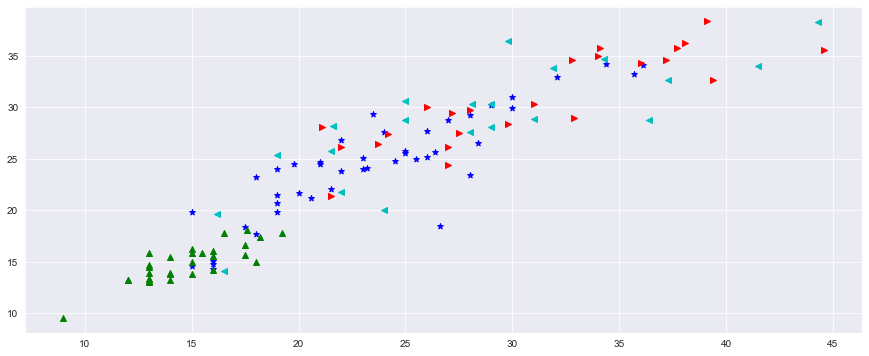

In [98]:
#Predictions from our cluster 0 Model 
plt.subplots(figsize=(15, 6))
predictions = lr0.predict(X_test_0)
plt.scatter(y_test_0,predictions,color='b',marker='*')

predictions = lr1.predict(X_test_1)
plt.scatter(y_test_1,predictions,color='g',marker='^')

predictions = lr2.predict(X_test_2)
plt.scatter(y_test_2,predictions,color='r',marker='>')

predictions = lr3.predict(X_test_3)
plt.scatter(y_test_3,predictions,color='c',marker='<')

In [99]:
#Lets apply Ridge for cluster1
# 
from sklearn.linear_model import Ridge

ridge = Ridge(alpha = 0.1, normalize = True)
ridge.fit(X_train_1,y_train_1)
ridge_predict = ridge.predict(X_test)
print('Ridge score: ',ridge.score(X_test,y_test))

Ridge score:  0.38791381284479476


In [100]:
#coefficients and intercept
for idx, col_name in enumerate(X_train_1.columns):
    print("The coefficient for {} is {}".format(col_name, ridge.coef_[0][idx]))
    
intercept4 = ridge.intercept_[0]
print("intercept for ridge model is ",intercept4)

The coefficient for cyl is -0.5120097019419472
The coefficient for disp is 0.0045268117245230366
The coefficient for hp is -4.224522068928234
The coefficient for wt is -0.001696431731613831
The coefficient for acc is -2.4654165050833665
The coefficient for age is -0.3549858448796338
The coefficient for origin_1 is 0.0
The coefficient for origin_2 is 0.0
The coefficient for origin_3 is 0.0
intercept for ridge model is  55.21312531423297


In [101]:
tempdf3 = pd.DataFrame({'Type':['ridge_cluster1'],'cyl': [ridge.coef_[0][0]],'disp':[ridge.coef_[0][1]],'hp':[ridge.coef_[0][2]],'wt':[ridge.coef_[0][3]],
                          'acc': [ridge.coef_[0][4]],'age': [ridge.coef_[0][5]],'origin_1': [ridge.coef_[0][6]],'origin_2': [ridge.coef_[0][7]],
                          'origin_3': [ridge.coef_[0][8]],'Intercept': [intercept4],
                          'R2_train': [ridge.score(X_train, y_train)],'R2_test': [ridge.score(X_test, y_test)]})
resultsDf = pd.concat([resultsDf, tempdf3])
resultsDf = resultsDf[['Type', 'cyl', 'disp', 'hp', 'wt', 'acc', 'age', 'origin_1', 'origin_2',
       'origin_3','Intercept','R2_train','R2_test']]

In [102]:
resultsDf

,Type,cyl,disp,hp,wt,acc,age,origin_1,origin_2,origin_3,Intercept,R2_train,R2_test
0,Base,-0.198519,0.018268,-9.007024,-0.004583,-3.304769,-0.723089,-1.684871,0.555584,1.129286,90.686487,0.832726,0.852196
0,Cluster0,0.736913,-0.023516,-5.177428,-0.005372,-7.405749,-0.721689,0.000000,0.000000,0.000000,88.165346,0.774397,0.802582
0,Cluster1,-0.728482,0.008991,-5.346410,-0.001859,-2.991336,-0.393550,0.000000,0.000000,0.000000,63.426415,0.492465,0.495452
0,Cluster2,0.718798,0.040249,-3.931884,-0.009535,4.677500,-0.873252,0.000000,0.000000,0.000000,53.480829,0.696576,0.687119
0,Cluster3,-1.866914,-0.002773,3.383303,-0.008639,13.549579,-1.188441,0.000000,0.000000,0.000000,12.735947,-0.001502,-0.033186
0,ridge_cluster1,-0.512010,0.004527,-4.224522,-0.001696,-2.465417,-0.354986,0.000000,0.000000,0.000000,55.213125,0.381149,0.387914


In [103]:
# Apply Lasso for cluster1
from sklearn.linear_model import Lasso

lasso = Lasso(alpha = 0.1, normalize = True)
lasso.fit(X_train_1,y_train_1)

print('Lasso score: ',lasso.score(X_test,y_test))
print('Lasso coefficients: ',lasso.coef_)
print('Lasso Intercept: ',lasso.intercept_[0])

Lasso score:  -0.5783548001816594
Lasso coefficients:  [-0.         -0.         -0.39256416 -0.00078894  0.         -0.1497479
  0.          0.          0.        ]
Lasso Intercept:  21.378859773483544


#Applying ridge regression improved the score whereas with lasso score is reduced. 

#Coefficeints,intercept and score are varying by Applying different models on data

#As data set is small not able to experience the performance issues.

For BASE model - 
    Keeping all other features fixed, 1 unit decrease in cyl- averge no of cylinders associated to decrease of 1.98 mpg
    Keeping all other features fixed, 1 unit incarese in disp- averge no of dispalce associated to incarese of 0.18 mpg
    
For cluster1 model -
    Keeping all other features fixed, 1 unit increase in cyl- averge no of cylinders associated to increase of 7.36 mpg
    Keeping all other features fixed, 1 unit decrease in disp- averge no of displace associated to decrease of 0.23 mpg

similarly we can interpret the other features as well.
               

Improvisation:

Data has to be collected in more precise way. Found some ? marks with hp column data and have less number of records orgin 2&3 data compared to origin1.

not able to experience performance issues as dataset was very small.

Cluster data is imbalanced if we have more data clusters might be balanced and may get more accurate results.

# PART TWO

In [104]:
p2data = pd.read_excel(r'C:\Users\ascd0\Downloads\Part2 - Company.xlsx')

In [105]:
p2data_x = p2data.copy()

In [106]:
p2data.head(5)

,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,NaN
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A


In [107]:
print("Shape of df is", p2data.shape)
print("size of df is", p2data.size)

Shape of df is (61, 5)
size of df is 305


In [108]:
p2data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   A        61 non-null     int64 
 1   B        61 non-null     int64 
 2   C        61 non-null     int64 
 3   D        61 non-null     int64 
 4   Quality  43 non-null     object
dtypes: int64(4), object(1)
memory usage: 2.5+ KB


In [109]:
p2data.describe()

,A,B,C,D
count,61.000000,61.000000,61.000000,61.000000
mean,118.557377,116.639344,114.081967,114.459016
std,61.771494,57.897908,65.615368,63.144431
min,3.000000,5.000000,3.000000,3.000000
25%,61.000000,63.000000,59.000000,51.000000
50%,136.000000,138.000000,135.000000,132.000000
75%,171.000000,168.000000,174.000000,174.000000
max,200.000000,200.000000,200.000000,199.000000


In [110]:
p2data.isna().sum()

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

In [111]:
#quality column is having null vlaues..lets see value counts of quality
p2data.Quality.value_counts()

Quality A    26
Quality B    17
Name: Quality, dtype: int64

<AxesSubplot:xlabel='Quality', ylabel='count'>

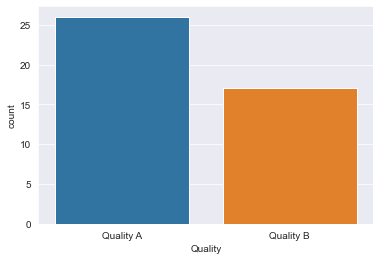

In [112]:
sns.countplot(x=p2data['Quality'])

array([[<AxesSubplot:title={'center':'A'}>,
        <AxesSubplot:title={'center':'B'}>],
       [<AxesSubplot:title={'center':'C'}>,
        <AxesSubplot:title={'center':'D'}>]], dtype=object)

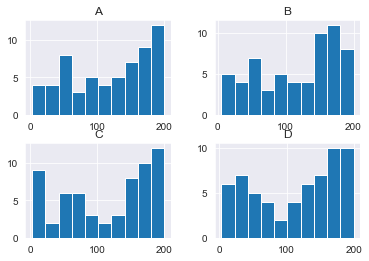

In [113]:
p2data.hist()

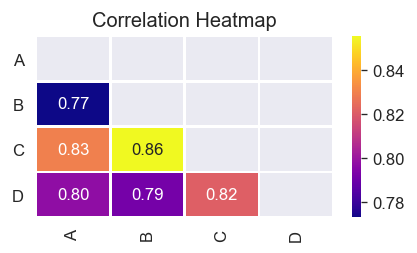

In [114]:
sns.set_style('darkgrid')
plt.figure(dpi = 120,figsize= (4,2))
mask = np.triu(np.ones_like(p2data.corr(),dtype = bool))
sns.heatmap(p2data.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'plasma')
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.title('Correlation Heatmap')
plt.show()

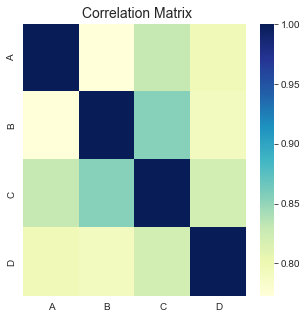

In [115]:
 
# Sample figsize in inches
fig, ax = plt.subplots(figsize=(5,5))         
# Imbalanced DataFrame Correlation
corr = p2data.corr()
sns.heatmap(corr, cmap='YlGnBu', annot_kws={'size':30}, ax=ax)
ax.set_title(" Correlation Matrix", fontsize=14)
plt.show()

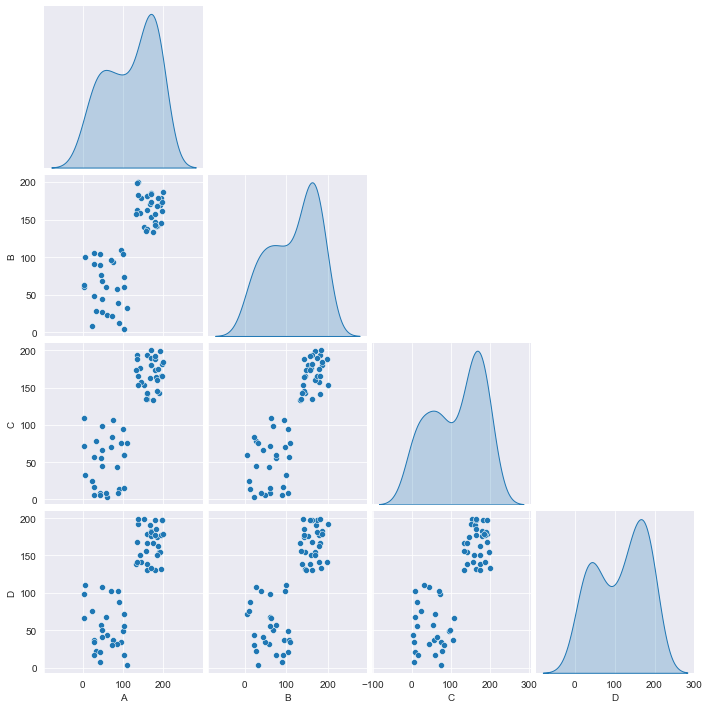

In [116]:
sns.pairplot(p2data,corner=True,diag_kind='kde')

In [117]:
p2data.Quality.unique()

array(['Quality A', 'Quality B', nan], dtype=object)

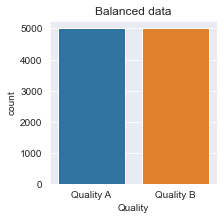

In [118]:
# Shuffle the Dataset.
shuffled_df = p2data.sample(frac=1,random_state=4)

# randoly select few A class samples and place in a separate dataset.
A_df = shuffled_df.loc[shuffled_df['Quality'] == 'Quality A'].sample(n=5000,random_state=42,replace=True)

#Randomly select few B class samples and place in a dataset
B_df = shuffled_df.loc[shuffled_df['Quality'] == 'Quality B'].sample(n=5000,random_state=42,replace=True)

# Concatenate both dataframes again
sample_df = pd.concat([A_df, B_df])

#plot the dataset
plt.figure(figsize=(3, 3))
sns.countplot(x='Quality', data=sample_df)
plt.title('Balanced data')
plt.show()

In [119]:
sample_df.head(5)

,A,B,C,D,Quality
16,4,61,72,98,Quality A
42,48,68,98,51,Quality A
51,110,33,76,3,Quality A
13,45,76,56,57,Quality A
17,96,109,75,34,Quality A


In [120]:
sample_df.isnull().sum()

A          0
B          0
C          0
D          0
Quality    0
dtype: int64

In [121]:
sample_df.describe()

,A,B,C,D
count,10000.000000,10000.000000,10000.000000,10000.000000
mean,113.122300,115.345700,113.097700,108.547500
std,61.049716,59.085871,65.706133,62.698544
min,3.000000,5.000000,3.000000,3.000000
25%,59.000000,63.000000,59.000000,44.000000
50%,121.000000,121.000000,121.500000,121.000000
75%,170.000000,168.000000,176.000000,168.000000
max,200.000000,200.000000,200.000000,198.000000


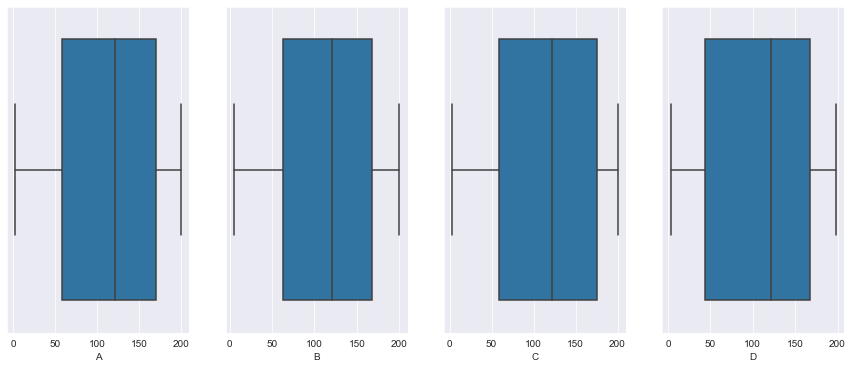

In [122]:
count=1
list=['A','B','C','D']
plt.subplots(figsize=(15, 6))
for col in list:
    plt.subplot(1,4,count)
    sns.boxplot(x=sample_df[col])
    count+=1

plt.show()

In [123]:
#from above we can understand median is not the centre. data is bit skewed to right

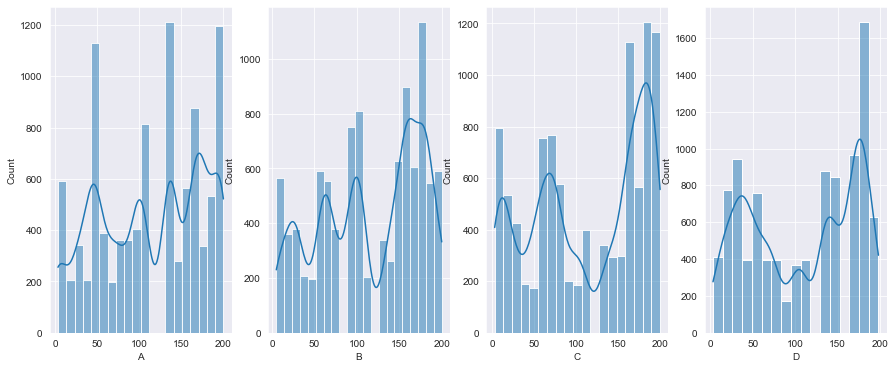

In [124]:
count=1
list=['A','B','C','D']
plt.subplots(figsize=(15, 6))
for col in list:
    plt.subplot(1,4,count)
    sns.histplot(x=sample_df[col],kde=True)
    count+=1

plt.show()

In [125]:
#From above distplots we can understand data is not normaly distributed 

Conclusion:
    As data is not normally distrbuted and skewness existed in data, imputing with mean is not a good approach.
    
    imputing with mean...distributuon can be biased by the values at the far.
    
    So, Replacing with median is good practise.

# PART 3

In [126]:
p3data = pd.read_csv(r'C:\Users\ascd0\Downloads\Part3 - vehicle.csv')

In [127]:
p3data.head(5)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [128]:
p3data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

In [129]:
p3data.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


In [130]:
#From above mean and std we can understand the data is spreaded largely 

In [131]:
p3data.skew()

compactness                    0.381271
circularity                    0.261809
distance_circularity           0.106585
radius_ratio                   0.394978
pr.axis_aspect_ratio           3.830362
max.length_aspect_ratio        6.778394
scatter_ratio                  0.607271
elongatedness                  0.047847
pr.axis_rectangularity         0.770889
max.length_rectangularity      0.256359
scaled_variance                0.651598
scaled_variance.1              0.842034
scaled_radius_of_gyration      0.279317
scaled_radius_of_gyration.1    2.083496
skewness_about                 0.776519
skewness_about.1               0.688017
skewness_about.2               0.249321
hollows_ratio                 -0.226341
dtype: float64

#it seems data is highly positive skewed for below
pr.axis_aspect_ratio           3.830362
max.length_aspect_ratio        6.778394
scaled_radius_of_gyration.1    2.083496

Negatively skwed:
hollows_ratio                 -0.226341

In [132]:
p3data.isnull().sum()
#data is having some null values

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [133]:
#lets replace null values with median
p3data.fillna(p3data.median(),inplace=True)

In [134]:
p3data.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

car    429
bus    218
van    199
Name: class, dtype: int64 



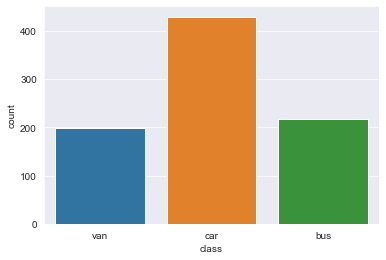

In [135]:
#Lets see class distribution

print(p3data['class'].value_counts(),'\n')
sns.countplot(p3data['class']);

In [136]:
#Car class data is having more than 400 records. Bus & van are about 200 records

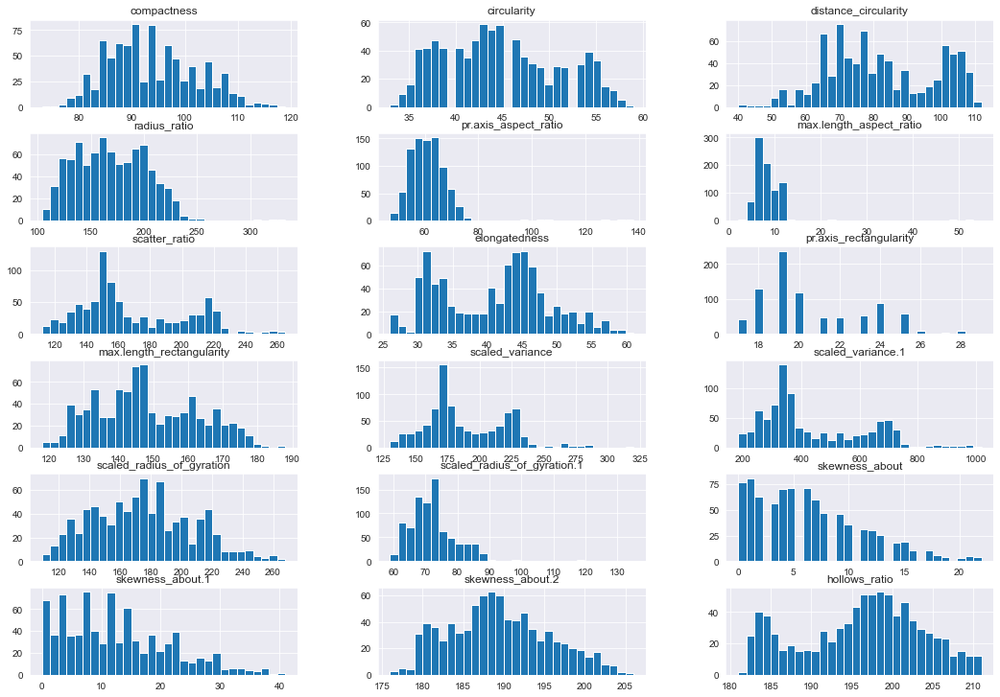

In [137]:
p3data.hist(stacked=False, bins=30, figsize=(18,30), layout=(14,3)); 

#seems data is heavily skewed.out of all columns almost for 8 columns most data existed on left side...normalization of data would be helpful

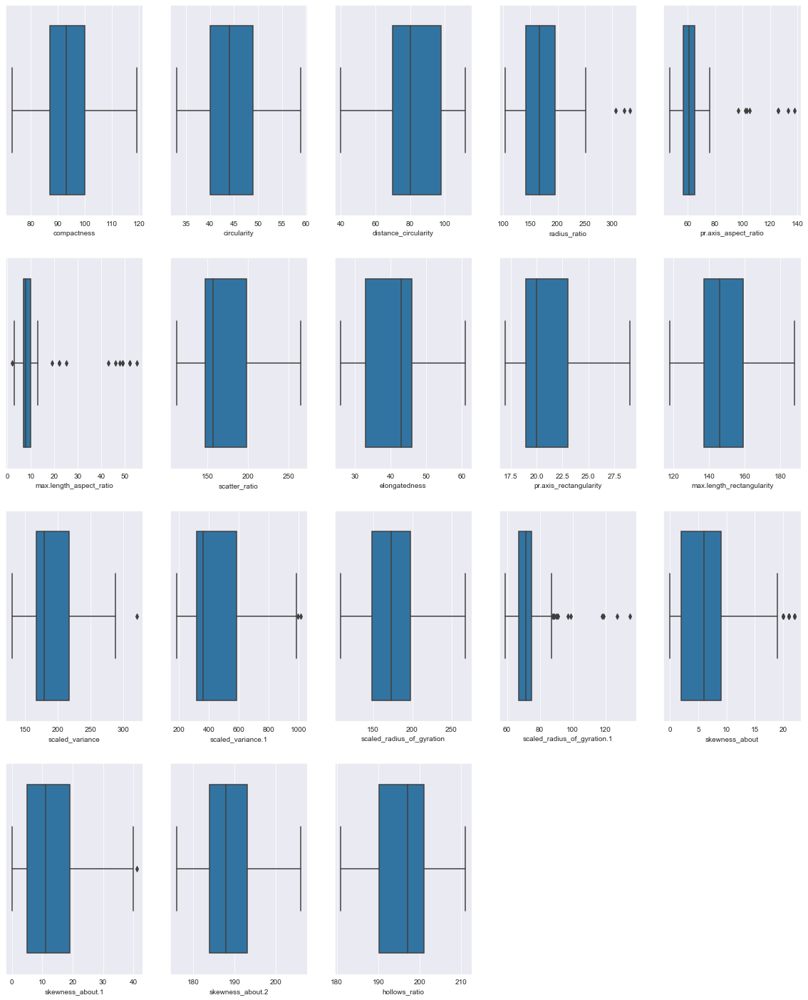

In [138]:
count=1
plt.subplots(figsize=(20, 25))
for col in p3data.columns[0:18]:
    plt.subplot(4,5,count)
    sns.boxplot(x=p3data[col])
    count+=1

plt.show()

'compactness' and 'circularity' looks to be normally distributed

distance_circularity is left skewd(Negative). Most data existed on right side

Below columns are having most outliers and data is right skewed(Positive)
'radius_ratio','pr.axis_aspect_ratio', 'max.length_aspect_ratio','scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1'

'scaled_variance.1' column is haivng most extreme values

We can interpret the remaining columns in similar way

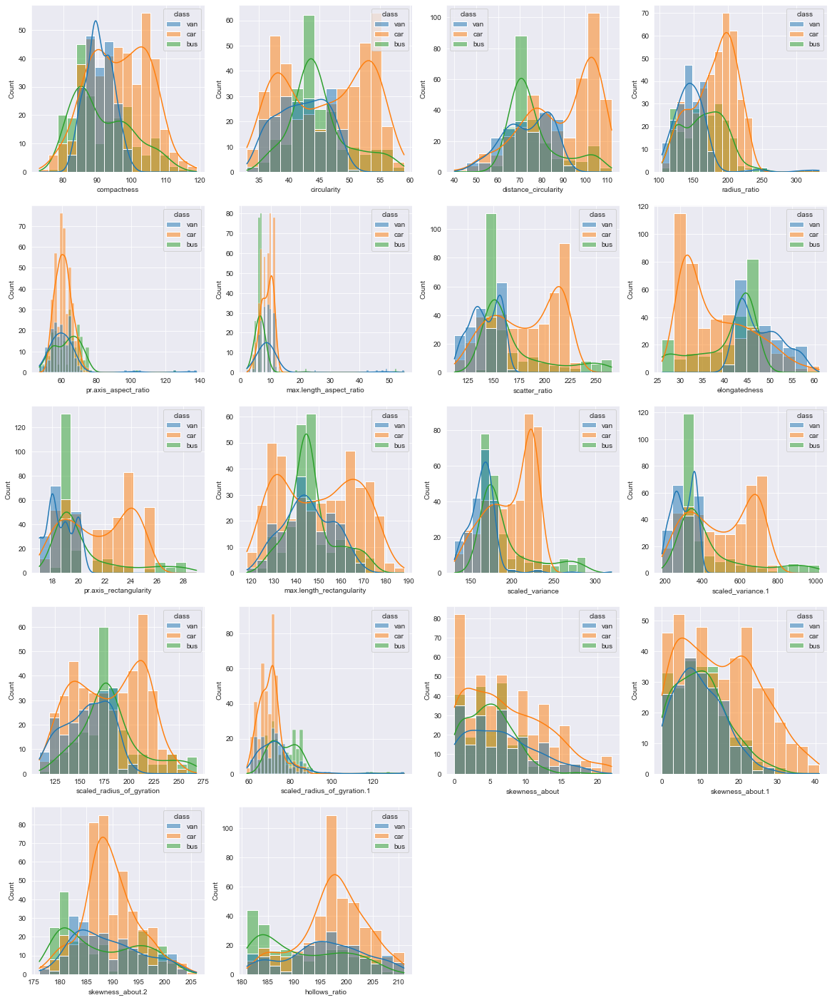

In [139]:
count=1
plt.subplots(figsize=(20, 25))
for col in p3data.columns[0:18]:
    plt.subplot(5,4,count)
    sns.histplot(x=p3data[col],hue=p3data['class'],kde=True)
    count+=1

plt.show()

In [140]:
p3data.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

Cars are having high values of compactness, distance_circularity, radius_ratio and     pr.axis_aspect_ratio,elongatedness,scaled_variance, 'scaled_radius_of_gyration', 'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1','skewness_about.2', 'hollows_ratio'

cars and bus are having same values for circularity and max.length_aspect_ratio

buses are high vlaues for scatter_ratio, pr.axis_rectangularity, max.length_rectangularity and scaled_variance.1

vans dont have high values for any of the features

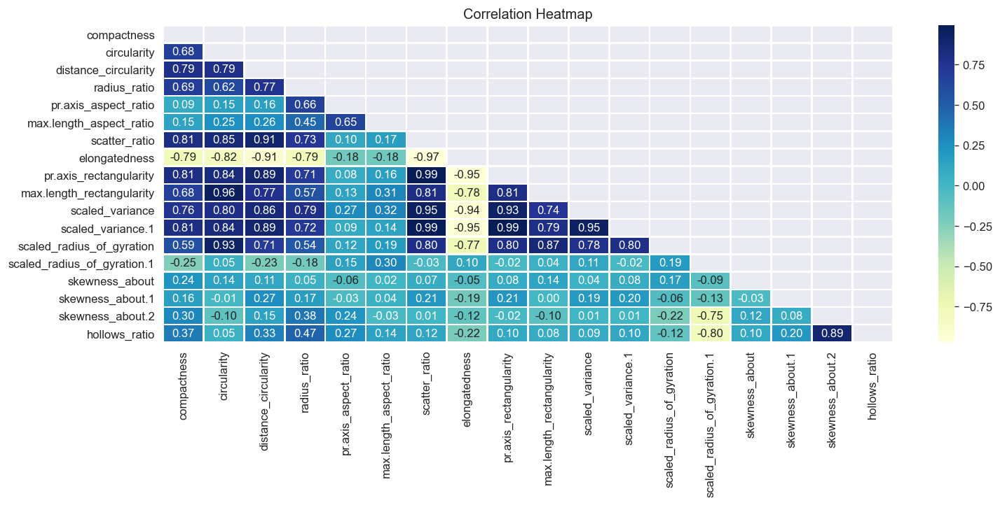

In [141]:
#correlation heatmap
sns.set_style('darkgrid')
plt.figure(dpi = 120,figsize= (14,5))
mask = np.triu(np.ones_like(p3data.corr(),dtype = bool))
sns.heatmap(p3data.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'YlGnBu')
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.title('Correlation Heatmap')
plt.show()

In [142]:
p3data.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

#from above it seems multiple features are correlating with each other highly leading to multi collinearity.
circularity is highly correlating with max.length_rectangularity and scaled_radius_of_gyration
distance_circularity is highly correlating with scatter_ratio
scatter_ratio is highly correalting with pr.axis_rectangularity' and 'scaled_variance', 'scaled_variance.1'

seems very difficult to choose features to remove the highly correalted fatures

<Figure size 720x480 with 0 Axes>

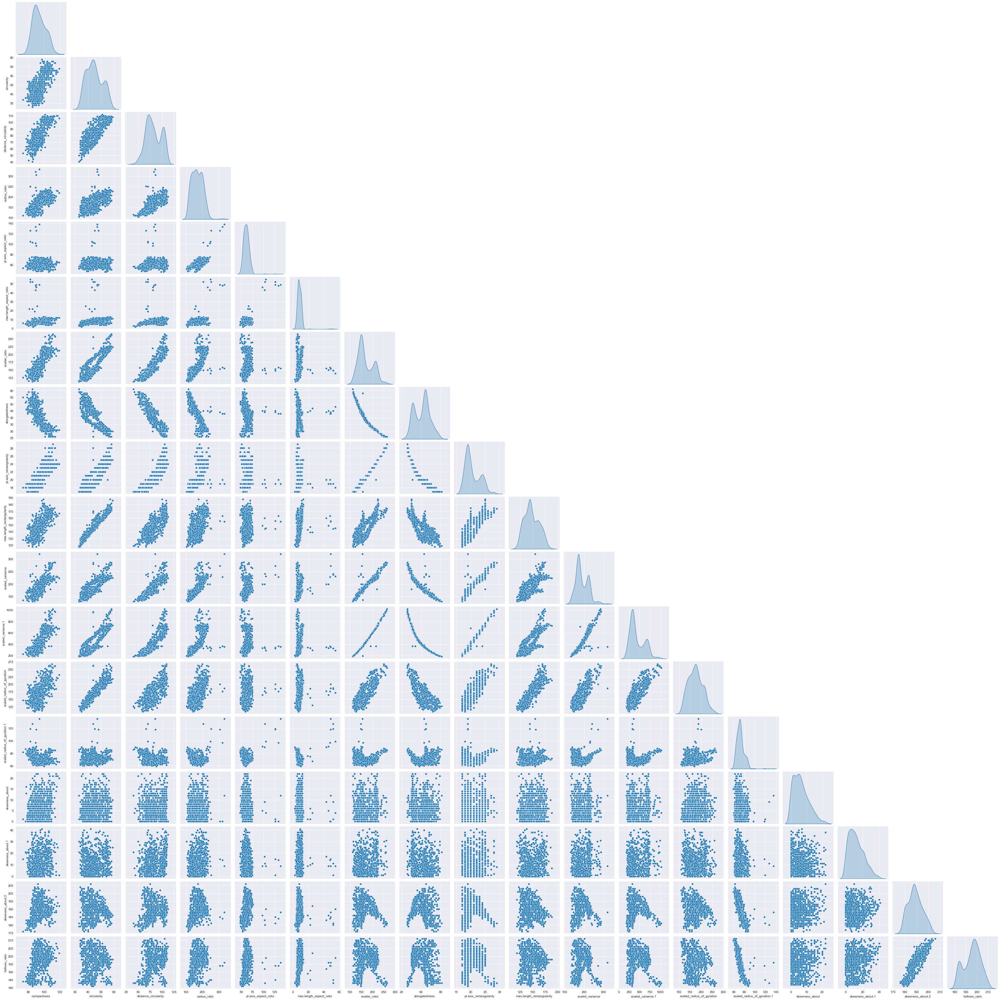

In [143]:
plt.figure(dpi=120)
sns.pairplot(p3data,diag_kind='kde',corner=True)
plt.show()

In [144]:
#most of the features are non-linear and corrleating with each other 

# Design and train a best fit SVM classier

In [145]:
le = LabelEncoder()
p3data['class'] = le.fit_transform(p3data['class'])
p3data.head(5)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,2
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,2
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,1
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,2
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,0


In [146]:
#split features and target

X = p3data.drop(['class'], axis=1)
y = p3data["class"]

# Scale the data to be between -1 and 1
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 10)

print('x_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('x_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)

x_train shape:  (676, 18)
y_train shape:  (676,)
x_test shape:  (170, 18)
y_test shape:  (170,)


Accuracy score of Train set - 0.977810650887574
Accuracy score of Test  set - 0.9411764705882353


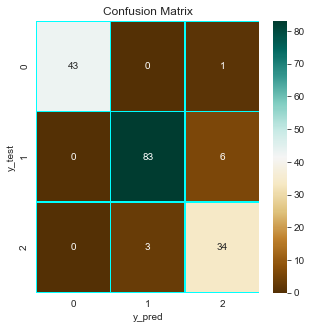

              precision    recall  f1-score   support

           0       1.00      0.98      0.99        44
           1       0.97      0.93      0.95        89
           2       0.83      0.92      0.87        37

    accuracy                           0.94       170
   macro avg       0.93      0.94      0.94       170
weighted avg       0.94      0.94      0.94       170



In [147]:
from sklearn.svm import SVC

# Building a Support Vector Machine on train data with default parameters
svc_model = SVC()
svc_model.fit(X_train, y_train)

prediction = svc_model .predict(X_test)

# check the accuracy on the training set
print("Accuracy score of Train set -",svc_model.score(X_train, y_train))
print("Accuracy score of Test  set -",svc_model.score(X_test, y_test))

# Confusion matrix for visualization our prediction accuracy:
from sklearn.metrics import confusion_matrix

# Creating the confusion matrix:
svc_cm = confusion_matrix(y_test, prediction)

# Visualization:
f, ax = plt.subplots(figsize=(5,5))
sns.heatmap(svc_cm, annot=True, linewidth=0.7, linecolor='cyan', fmt='.0f', ax=ax, cmap='BrBG')
plt.title('Confusion Matrix')
plt.xlabel('y_pred')
plt.ylabel('y_test')
plt.show()

from sklearn.metrics import classification_report
#classification Report
print(classification_report(y_test,prediction))

Accuracy score of Train set - 0.9556213017751479
Accuracy score of Test  set - 0.9588235294117647


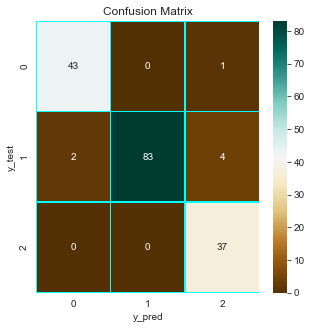

              precision    recall  f1-score   support

           0       0.96      0.98      0.97        44
           1       1.00      0.93      0.97        89
           2       0.88      1.00      0.94        37

    accuracy                           0.96       170
   macro avg       0.95      0.97      0.96       170
weighted avg       0.96      0.96      0.96       170



In [149]:
# Building a Support Vector Machine on train data with linear kernel
svc_model = SVC(C= 0.5, kernel='linear', gamma= 1)
svc_model.fit(X_train, y_train)

prediction = svc_model .predict(X_test)

# check the accuracy on the training set
print("Accuracy score of Train set -",svc_model.score(X_train, y_train))
print("Accuracy score of Test  set -",svc_model.score(X_test, y_test))

# Creating the confusion matrix:
svc_cm = confusion_matrix(y_test, prediction)

# Visualization:
f, ax = plt.subplots(figsize=(5,5))
sns.heatmap(svc_cm, annot=True, linewidth=0.7, linecolor='cyan', fmt='.0f', ax=ax, cmap='BrBG')
plt.title('Confusion Matrix')
plt.xlabel('y_pred')
plt.ylabel('y_test')
plt.show()

#classification Report
print(classification_report(y_test,prediction))

In [150]:
#For linear kernel got best accuracy scores with c=0.5

Accuracy score of Train set - 0.9393491124260355
Accuracy score of Test  set - 0.9117647058823529


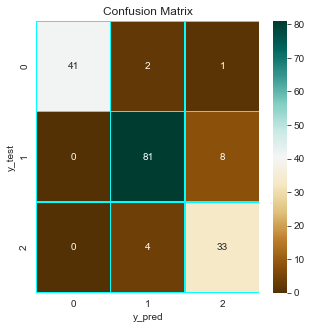

              precision    recall  f1-score   support

           0       1.00      0.93      0.96        44
           1       0.93      0.91      0.92        89
           2       0.79      0.89      0.84        37

    accuracy                           0.91       170
   macro avg       0.91      0.91      0.91       170
weighted avg       0.92      0.91      0.91       170



In [151]:
# Building a Support Vector Machine on train data with RBF kernel
svc_model = SVC(C= 0.2, kernel='rbf', gamma= 0.1)
svc_model.fit(X_train, y_train)

prediction = svc_model .predict(X_test)

# check the accuracy on the training set
print("Accuracy score of Train set -",svc_model.score(X_train, y_train))
print("Accuracy score of Test  set -",svc_model.score(X_test, y_test))

# Creating the confusion matrix:
svc_cm = confusion_matrix(y_test, prediction)

# Visualization:
f, ax = plt.subplots(figsize=(5,5))
sns.heatmap(svc_cm, annot=True, linewidth=0.7, linecolor='cyan', fmt='.0f', ax=ax, cmap='BrBG')
plt.title('Confusion Matrix')
plt.xlabel('y_pred')
plt.ylabel('y_test')
plt.show()

#classification Report
print(classification_report(y_test,prediction))

Accuracy score of Train set - 0.9985207100591716
Accuracy score of Test  set - 0.9411764705882353


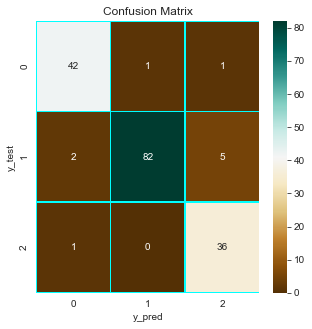

              precision    recall  f1-score   support

           0       0.93      0.95      0.94        44
           1       0.99      0.92      0.95        89
           2       0.86      0.97      0.91        37

    accuracy                           0.94       170
   macro avg       0.93      0.95      0.94       170
weighted avg       0.95      0.94      0.94       170



In [152]:
#Building a Support Vector Machine on train data with poly kernel
svc_model  = SVC(C= 0.1, kernel='poly', gamma= 0.5)
svc_model.fit(X_train, y_train)

prediction = svc_model.predict(X_test)

# check the accuracy on the training set
print("Accuracy score of Train set -",svc_model.score(X_train, y_train))
print("Accuracy score of Test  set -",svc_model.score(X_test, y_test))

# Creating the confusion matrix:
svc_cm = confusion_matrix(y_test, prediction)

# Visualization:
f, ax = plt.subplots(figsize=(5,5))
sns.heatmap(svc_cm, annot=True, linewidth=0.7, linecolor='cyan', fmt='.0f', ax=ax, cmap='BrBG')
plt.title('Confusion Matrix')
plt.xlabel('y_pred')
plt.ylabel('y_test')
plt.show()

#classification Report
print(classification_report(y_test,prediction))

#out of all kernels....got best results with linear kernel with C=0.5
Accuracy score of Test  set - 0.9588235294117647
F1 Score Accuracy           - 0.96

# Dimensional reduction

In [153]:
# generating the covariance matrix and the eigen values for the PCA analysis
cov_matrix = np.cov(X_train.T) # the relevanat covariance matrix
pd.DataFrame(cov_matrix)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,1.033227,0.696661,0.805614,0.694990,0.083561,0.146735,0.821107,-0.796729,0.822364,0.696246,0.764572,0.821097,0.597825,-0.270563,0.250735,0.165660,0.307482,0.383676
1,0.696661,0.986671,0.783754,0.632321,0.173764,0.250554,0.838000,-0.814614,0.831057,0.949639,0.789079,0.825944,0.913888,0.042531,0.146521,0.004668,-0.080558,0.066850
2,0.805614,0.783754,1.001579,0.769240,0.157289,0.263464,0.902864,-0.910641,0.890333,0.773257,0.857843,0.883675,0.701866,-0.233689,0.118655,0.274977,0.154378,0.344969
3,0.694990,0.632321,0.769240,1.027303,0.719860,0.525156,0.735467,-0.791411,0.708642,0.590369,0.806716,0.717936,0.547603,-0.148504,0.043380,0.179161,0.374972,0.479369
4,0.083561,0.173764,0.157289,0.719860,1.126752,0.805247,0.102632,-0.184210,0.077271,0.152477,0.305865,0.086803,0.139843,0.236901,-0.078032,-0.039396,0.228060,0.269228
5,0.146735,0.250554,0.263464,0.525156,0.805247,1.200725,0.160966,-0.177077,0.154498,0.307247,0.363200,0.137928,0.192285,0.400413,0.001410,0.046023,-0.031225,0.141095
6,0.821107,0.838000,0.902864,0.735467,0.102632,0.160966,0.995960,-0.969578,0.983409,0.806109,0.940129,0.987609,0.794688,-0.040867,0.082761,0.219452,0.011786,0.131735
7,-0.796729,-0.814614,-0.910641,-0.791411,-0.184210,-0.177077,-0.969578,1.000548,-0.945081,-0.774502,-0.930154,-0.950929,-0.764155,0.113329,-0.059179,-0.194967,-0.116650,-0.227768
8,0.822364,0.831057,0.890333,0.708642,0.077271,0.154498,0.983409,-0.945081,0.992473,0.805950,0.924298,0.981214,0.789300,-0.030907,0.092461,0.221915,-0.008075,0.114696
9,0.696246,0.949639,0.773257,0.590369,0.152477,0.307247,0.806109,-0.774502,0.805950,0.988564,0.746797,0.792856,0.860653,0.033682,0.136332,0.015501,-0.077679,0.095568


In [154]:
pca = PCA(random_state=42)
pca.fit(X)

#generating the eigen values and the eigen vectors
#eigen vectors are the principal components and the corresponding eigen values which are the magnitudes of variance captured

# Eignen values
pca.explained_variance_

array([9.40460261e+00, 3.01492206e+00, 1.90352502e+00, 1.17993747e+00,
       9.17260633e-01, 5.39992629e-01, 3.58870118e-01, 2.21932456e-01,
       1.60608597e-01, 9.18572234e-02, 6.64994118e-02, 4.66005994e-02,
       3.57947189e-02, 2.74120657e-02, 2.05792871e-02, 1.79166314e-02,
       1.00257898e-02, 2.96445743e-03])

In [155]:
# Eigen Vectors
pd.DataFrame(pca.components_)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.275284,0.293258,0.304609,0.267607,0.080504,0.097276,0.317093,-0.314133,0.313959,0.282831,0.309280,0.313788,0.272047,-0.020814,0.041456,0.058225,0.030280,0.074145
1,-0.126954,0.125577,-0.072952,-0.189634,-0.122175,0.010748,0.048118,0.012750,0.059935,0.116221,0.062281,0.053784,0.209233,0.488525,-0.055090,-0.124085,-0.540915,-0.540354
2,-0.119922,-0.024821,-0.056014,0.275074,0.642013,0.591801,-0.097628,0.057648,-0.109512,-0.017064,0.056324,-0.108841,-0.031464,0.286277,-0.115679,-0.075283,0.008736,0.039524
3,0.078384,0.187337,-0.071201,-0.042605,0.032726,0.031415,-0.095749,0.082290,-0.092458,0.188006,-0.119844,-0.091745,0.200095,-0.065505,0.604794,-0.666114,0.105526,0.047489
4,0.069518,-0.085065,0.040665,-0.046147,-0.040549,0.213433,-0.015485,0.076852,0.002176,-0.060637,-0.000456,-0.019555,-0.061599,0.145530,0.729190,0.599196,-0.100602,-0.029861
5,0.144875,-0.302731,-0.138406,0.248137,0.236933,-0.419331,0.116100,-0.141840,0.098056,-0.461675,0.236225,0.157820,-0.135576,0.241357,0.203209,-0.191961,0.156939,-0.241223
6,0.451862,-0.249103,0.074035,-0.176913,-0.397877,0.503414,0.064988,0.013811,0.096657,-0.104552,0.114623,0.083735,-0.373944,0.111953,-0.080633,-0.284559,0.018145,0.015724
7,-0.566137,-0.179852,0.434749,0.101998,-0.068715,0.161153,0.100688,-0.215497,0.063593,-0.249496,0.050210,0.043765,-0.108474,-0.340878,0.156488,-0.208774,-0.304580,-0.030419
8,-0.484418,-0.014157,-0.167572,-0.230314,-0.277128,0.148032,0.054457,-0.156867,0.005250,-0.061036,0.297588,0.083367,0.241655,0.320222,0.022105,0.010176,0.517223,0.171506
9,-0.260076,0.098078,-0.205032,-0.047789,0.108075,-0.118266,0.165167,-0.151612,0.193778,0.469060,-0.129986,0.158204,-0.686494,0.127648,0.098364,-0.035515,0.019396,0.064131


In [156]:
total = []
k=1
for i in pca.explained_variance_ratio_*100:
    total.append(i)
    print('Variance explained by Principle Component',k,'is : {:.2f}%'.format(i))
    k=k+1

Variance explained by Principle Component 1 is : 52.19%
Variance explained by Principle Component 2 is : 16.73%
Variance explained by Principle Component 3 is : 10.56%
Variance explained by Principle Component 4 is : 6.55%
Variance explained by Principle Component 5 is : 5.09%
Variance explained by Principle Component 6 is : 3.00%
Variance explained by Principle Component 7 is : 1.99%
Variance explained by Principle Component 8 is : 1.23%
Variance explained by Principle Component 9 is : 0.89%
Variance explained by Principle Component 10 is : 0.51%
Variance explained by Principle Component 11 is : 0.37%
Variance explained by Principle Component 12 is : 0.26%
Variance explained by Principle Component 13 is : 0.20%
Variance explained by Principle Component 14 is : 0.15%
Variance explained by Principle Component 15 is : 0.11%
Variance explained by Principle Component 16 is : 0.10%
Variance explained by Principle Component 17 is : 0.06%
Variance explained by Principle Component 18 is : 0.02

In [157]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)
var_cumu

array([0.52186034, 0.68915802, 0.79478441, 0.86025901, 0.9111577 ,
       0.94112183, 0.96103549, 0.97335049, 0.98226265, 0.98735979,
       0.99104984, 0.9936357 , 0.99562195, 0.99714304, 0.99828498,
       0.99927917, 0.9998355 , 1.        ])

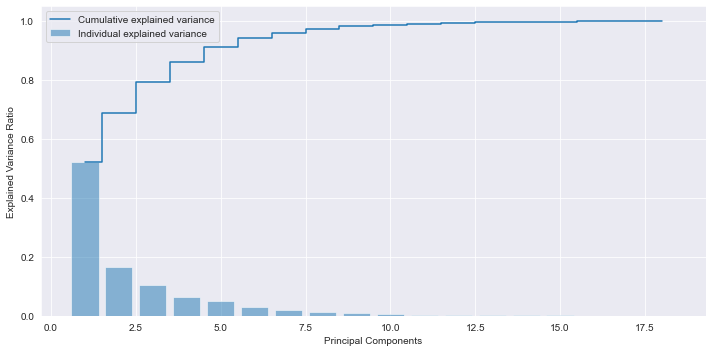

In [158]:
# Plotting the variance expalained by the principal components and the cumulative variance explained.
plt.figure(figsize=(10 , 5))
plt.bar(range(1, 19), pca.explained_variance_ratio_, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, 19), var_cumu, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

In [159]:
#Here we can observe by combining first 11 principal components we are getting accuracy of 99

In [160]:
pca_11 = PCA(n_components=11)  #specifying 11 PC components
pca_11.fit(X)

PCA(n_components=11)

In [161]:
# Eigen Vectors
pd.DataFrame(pca_11.components_)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.275284,0.293258,0.304609,0.267607,0.080504,0.097276,0.317093,-0.314133,0.313959,0.282831,0.309280,0.313788,0.272047,-0.020814,0.041456,0.058225,0.030280,0.074145
1,-0.126954,0.125577,-0.072952,-0.189634,-0.122175,0.010748,0.048118,0.012750,0.059935,0.116221,0.062281,0.053784,0.209233,0.488525,-0.055090,-0.124085,-0.540915,-0.540354
2,-0.119922,-0.024821,-0.056014,0.275074,0.642013,0.591801,-0.097628,0.057648,-0.109512,-0.017064,0.056324,-0.108841,-0.031464,0.286277,-0.115679,-0.075283,0.008736,0.039524
3,0.078384,0.187337,-0.071201,-0.042605,0.032726,0.031415,-0.095749,0.082290,-0.092458,0.188006,-0.119844,-0.091745,0.200095,-0.065505,0.604794,-0.666114,0.105526,0.047489
4,0.069518,-0.085065,0.040665,-0.046147,-0.040549,0.213433,-0.015485,0.076852,0.002176,-0.060637,-0.000456,-0.019555,-0.061599,0.145530,0.729190,0.599196,-0.100602,-0.029861
5,0.144875,-0.302731,-0.138406,0.248137,0.236933,-0.419331,0.116100,-0.141840,0.098056,-0.461675,0.236225,0.157820,-0.135576,0.241357,0.203209,-0.191961,0.156939,-0.241223
6,0.451862,-0.249103,0.074035,-0.176913,-0.397877,0.503414,0.064988,0.013811,0.096657,-0.104552,0.114623,0.083735,-0.373944,0.111953,-0.080633,-0.284559,0.018145,0.015724
7,-0.566137,-0.179852,0.434749,0.101998,-0.068715,0.161153,0.100688,-0.215497,0.063593,-0.249496,0.050210,0.043765,-0.108474,-0.340878,0.156488,-0.208774,-0.304580,-0.030419
8,-0.484418,-0.014157,-0.167572,-0.230314,-0.277128,0.148032,0.054457,-0.156867,0.005250,-0.061036,0.297588,0.083367,0.241655,0.320222,0.022105,0.010176,0.517223,0.171506
9,-0.260076,0.098078,-0.205032,-0.047789,0.108075,-0.118266,0.165167,-0.151612,0.193778,0.469060,-0.129986,0.158204,-0.686494,0.127648,0.098364,-0.035515,0.019396,0.064131


In [162]:
# Eigen Values 
pca_11.explained_variance_

array([9.40460261, 3.01492206, 1.90352502, 1.17993747, 0.91726063,
       0.53999263, 0.35887012, 0.22193246, 0.1606086 , 0.09185722,
       0.06649941])

In [163]:
sum(pca_11.explained_variance_ratio_)
#we are getting 99% with choosen 11 PC

0.991049839135912

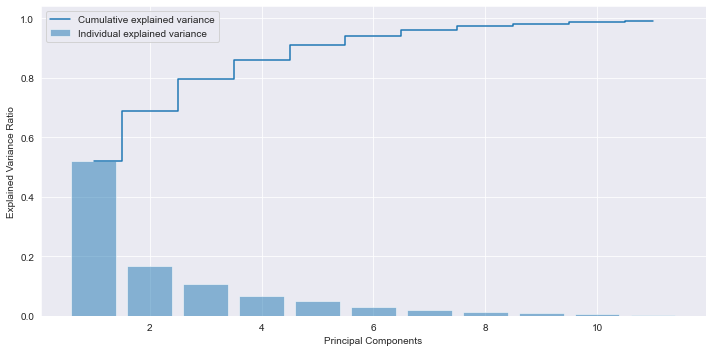

In [164]:
# Plotting the variance expalained by the principal components and the cumulative variance explained.
plt.figure(figsize=(10 , 5))
plt.bar(range(1, 12), pca_11.explained_variance_ratio_, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, 12), np.cumsum(pca_11.explained_variance_ratio_), where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

In [165]:
#with 8 features we are getting accuracy of 97.7

In [166]:
pca_8 = PCA(n_components=8)  #specifying 11 PC components
pca_8.fit(X)

# Eigen Vectors
pd.DataFrame(pca_8.components_)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.275284,0.293258,0.304609,0.267607,0.080504,0.097276,0.317093,-0.314133,0.313959,0.282831,0.309280,0.313788,0.272047,-0.020814,0.041456,0.058225,0.030280,0.074145
1,-0.126954,0.125577,-0.072952,-0.189634,-0.122175,0.010748,0.048118,0.012750,0.059935,0.116221,0.062281,0.053784,0.209233,0.488525,-0.055090,-0.124085,-0.540915,-0.540354
2,-0.119922,-0.024821,-0.056014,0.275074,0.642013,0.591801,-0.097628,0.057648,-0.109512,-0.017064,0.056324,-0.108841,-0.031464,0.286277,-0.115679,-0.075283,0.008736,0.039524
3,0.078384,0.187337,-0.071201,-0.042605,0.032726,0.031415,-0.095749,0.082290,-0.092458,0.188006,-0.119844,-0.091745,0.200095,-0.065505,0.604794,-0.666114,0.105526,0.047489
4,0.069518,-0.085065,0.040665,-0.046147,-0.040549,0.213433,-0.015485,0.076852,0.002176,-0.060637,-0.000456,-0.019555,-0.061599,0.145530,0.729190,0.599196,-0.100602,-0.029861
5,0.144875,-0.302731,-0.138406,0.248137,0.236933,-0.419331,0.116100,-0.141840,0.098056,-0.461675,0.236225,0.157820,-0.135576,0.241357,0.203209,-0.191961,0.156939,-0.241223
6,0.451862,-0.249103,0.074035,-0.176913,-0.397877,0.503414,0.064988,0.013811,0.096657,-0.104552,0.114623,0.083735,-0.373944,0.111953,-0.080633,-0.284559,0.018145,0.015724
7,-0.566137,-0.179852,0.434749,0.101998,-0.068715,0.161153,0.100688,-0.215497,0.063593,-0.249496,0.050210,0.043765,-0.108474,-0.340878,0.156488,-0.208774,-0.304580,-0.030419


In [167]:
# Eigen Values 
pca_8.explained_variance_

array([9.40460261, 3.01492206, 1.90352502, 1.17993747, 0.91726063,
       0.53999263, 0.35887012, 0.22193246])

In [168]:
sum(pca_8.explained_variance_ratio_)
#we are getting 97.33% with choosen 8 PC. Reducing 10 features from original set

0.9733504944506829

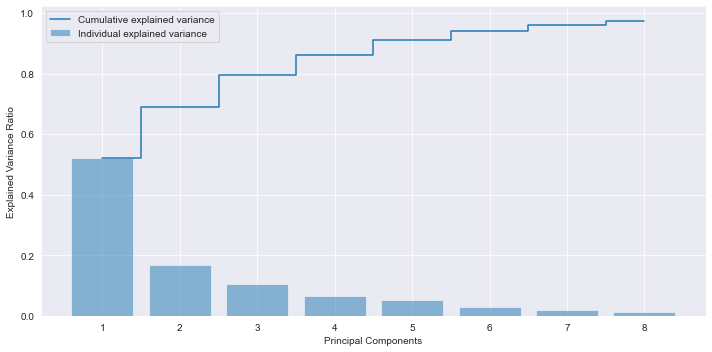

In [169]:
# Plotting the variance expalained by the principal components and the cumulative variance explained.
plt.figure(figsize=(10 , 5))
plt.bar(range(1, 9), pca_8.explained_variance_ratio_, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, 9), np.cumsum(pca_8.explained_variance_ratio_), where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

In [179]:
pca_final =  pca_8.transform(X)
print('shape of original set is       ',p3data.shape)
print('shape of final PCA model set is',pca_final.shape)

shape of original set is        (846, 19)
shape of final PCA model set is (846, 8)


<AxesSubplot:>

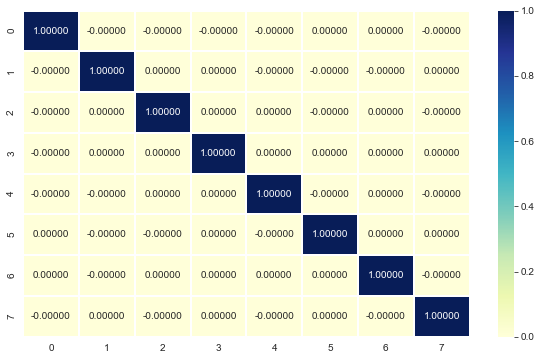

In [180]:
corrmat = np.corrcoef(pca_final.T)

#correlation heatmap
plt.figure(figsize=[10,6])
sns.heatmap(corrmat, fmt = ".5f",annot=True,lw=1,cmap = 'YlGnBu')

In [181]:
#with PCA multi collinarity is removed and can see zero correlation among features

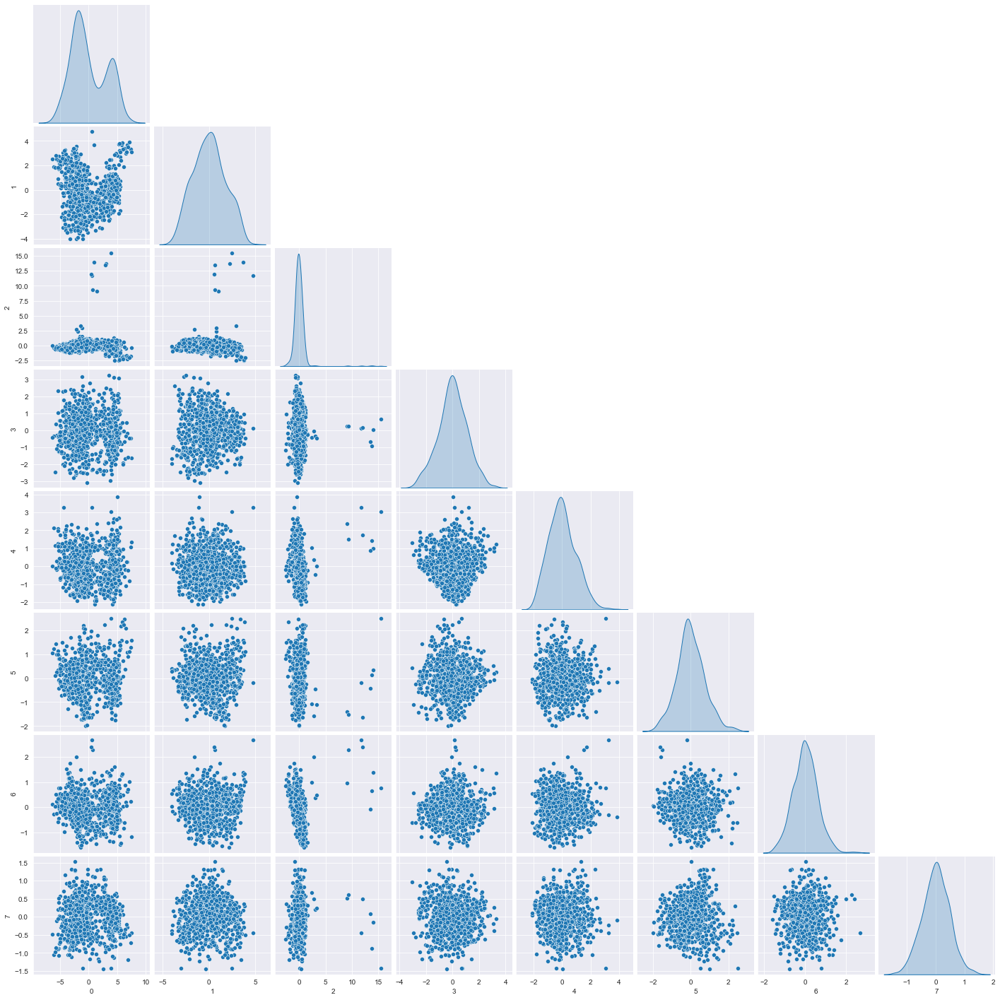

In [182]:
# Visualising PCA dimensions with pair plot
sns.pairplot(pd.DataFrame(pca_final),diag_kind = 'kde',corner=True)

In [174]:
#from above we can observe there is no correlation between most features

In [184]:
pd.DataFrame(pca_final).head(5)

,0,1,2,3,4,5,6,7
0,0.334162,-0.219026,1.001584,0.176612,0.079301,-0.757447,-0.901124,-0.381106
1,-1.591711,-0.420603,-0.369034,0.233234,0.693949,-0.517162,0.378637,0.247059
2,3.769324,0.195283,0.087859,1.202212,0.731732,0.705041,-0.034584,0.482772
3,-1.738598,-2.829692,0.109456,0.376685,-0.362897,-0.484431,0.470753,-0.023086
4,0.558103,4.758422,11.703647,0.147464,3.256953,-0.203446,2.671578,-0.448854


In [185]:
#split train and test features

X_train, X_test, y_train, y_test = train_test_split(pca_final,y, test_size = 0.2, random_state = 10)

print('x_train shape: ', X_train.shape)
print('y_train shape: ', y_train.shape)
print('x_test shape: ', X_test.shape)
print('y_test shape: ', y_test.shape)

x_train shape:  (676, 8)
y_train shape:  (676,)
x_test shape:  (170, 8)
y_test shape:  (170,)


Accuracy score of Train set - 0.878698224852071
Accuracy score of Test  set - 0.8411764705882353


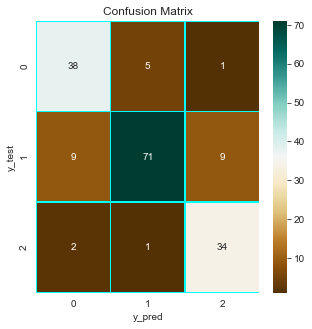

              precision    recall  f1-score   support

           0       0.78      0.86      0.82        44
           1       0.92      0.80      0.86        89
           2       0.77      0.92      0.84        37

    accuracy                           0.84       170
   macro avg       0.82      0.86      0.84       170
weighted avg       0.85      0.84      0.84       170



In [186]:
# Building a Support Vector Machine on reduced feature train data with linear kernel
svc_model = SVC(C= 0.5, kernel='linear', gamma= 1)
svc_model.fit(X_train, y_train)

prediction = svc_model .predict(X_test)

# check the accuracy on the training set
print("Accuracy score of Train set -",svc_model.score(X_train, y_train))
print("Accuracy score of Test  set -",svc_model.score(X_test, y_test))

# Creating the confusion matrix:
svc_cm = confusion_matrix(y_test, prediction)

# Visualization:
f, ax = plt.subplots(figsize=(5,5))
sns.heatmap(svc_cm, annot=True, linewidth=0.7, linecolor='cyan', fmt='.0f', ax=ax, cmap='BrBG')
plt.title('Confusion Matrix')
plt.xlabel('y_pred')
plt.ylabel('y_test')
plt.show()

#classification Report
print(classification_report(y_test,prediction))

Original Dataset scores
Accuracy score of Test  set - 0.9588235294117647
F1 Score Accuracy           - 0.96

Reduced feature set scores
Accuracy score of Test  set - 0.8411764705882353
F1 scores Accuracy          - 0.84

#By reducing the features of dataset from 18 to 8 using PCA Managed to get accuracy of 0.84 compared to original set accuracy of 0.96

with original dataframe observed much collinearity among features. collinarity reduced to almost zero with PCA.

# PART FOUR

In [187]:
p4data = pd.read_csv(r'C:\Users\ascd0\Downloads\Part4 - batting_bowling_ipl_bat.csv')

In [188]:
p4data.head(5)

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [189]:
p4data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 10.0+ KB


In [190]:
p4data.describe()

,Runs,Ave,SR,Fours,Sixes,HF
count,90.000000,90.000000,90.000000,90.000000,90.000000,90.000000
mean,219.933333,24.729889,119.164111,19.788889,7.577778,1.188889
std,156.253669,13.619215,23.656547,16.399845,8.001373,1.688656
min,2.000000,0.500000,18.180000,0.000000,0.000000,0.000000
25%,98.000000,14.665000,108.745000,6.250000,3.000000,0.000000
50%,196.500000,24.440000,120.135000,16.000000,6.000000,0.500000
75%,330.750000,32.195000,131.997500,28.000000,10.000000,2.000000
max,733.000000,81.330000,164.100000,73.000000,59.000000,9.000000


In [191]:
p4data.median()

Runs     196.500
Ave       24.440
SR       120.135
Fours     16.000
Sixes      6.000
HF         0.500
dtype: float64

In [192]:
p4data.skew()

Runs     0.754618
Ave      1.038076
SR      -1.166175
Fours    1.107192
Sixes    3.226595
HF       2.001199
dtype: float64

In [193]:
p4data.isnull().sum()

Name     90
Runs     90
Ave      90
SR       90
Fours    90
Sixes    90
HF       90
dtype: int64

In [194]:
#from quick look at data empty row in between each record...lets delete all null rows

In [195]:
p4data.dropna(inplace=True)

In [196]:
#Lets see the unique vlaues of all columns
for i in p4data.columns:
    print(f"unique {i} values :")
    print(f"{p4data[i].unique()}\n")

unique Name values :
['CH Gayle' 'G Gambhir' 'V Sehwag' 'CL White' 'S Dhawan' 'AM Rahane'
 'KP Pietersen' 'RG Sharma' 'AB de Villiers' 'JP Duminy' 'DA Warner'
 'SR Watson' 'F du Plessis' 'OA Shah' 'DJ Bravo' 'DJ Hussey' 'SK Raina'
 'AT Rayudu' 'Mandeep Singh' 'R Dravid' 'DR Smith' 'M Vijay' 'SPD Smith'
 'TM Dilshan' 'RV Uthappa' 'SE Marsh' 'KA Pollard' 'DMD Jayawardene'
 'V Kohli' 'MA Agarwal' 'SR Tendulkar' 'MEK Hussey' 'JH Kallis' 'MS Dhoni'
 'MS Bisla' 'JD Ryder' 'BJ Hodge' 'NV Ojha' 'DB Das' 'AC Gilchrist'
 'BB McCullum' 'IK Pathan' 'Azhar Mahmood' 'MK Pandey' 'S Badrinath'
 'DA Miller' 'MK Tiwary' 'JA Morkel' 'LRPL Taylor' 'M Manhas'
 'DT Christian' 'RA Jadeja' 'JEC Franklin' 'KC Sangakkara' 'Y Nagar'
 'STR Binny' 'SS Tiwary' 'KD Karthik' 'AL Menaria' 'PA Patel' 'SC Ganguly'
 'YK Pathan' 'Harbhajan Singh' 'RE Levi' 'LR Shukla' 'Y Venugopal Rao'
 'AD Mathews' 'PP Chawla' 'Shakib Al Hasan' 'N Saini' 'MN Samuels'
 'MJ Clarke' 'R Bhatia' 'R Vinay Kumar' 'P Kumar' 'J Botha'
 'A Ashish 

In [197]:
#From data we can see no special chars in data and all seems good

In [198]:
p4data.describe()[7:]

,Runs,Ave,SR,Fours,Sixes,HF
max,733.0,81.33,164.1,73.0,59.0,9.0


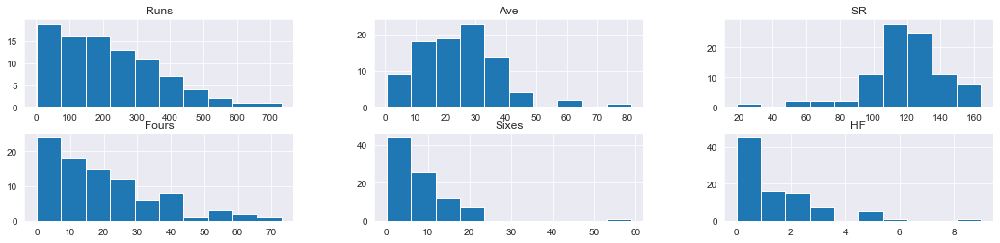

In [199]:
p4data.hist(stacked=False, figsize=(18,30), layout=(14,3)); 

#Runs- few people scored runs more than 700 and most peopel runs are in range of 0-450.max runs are 733
#AVE -  Few people have average of close to 80 and most people has 10-40 range of average. Max AVE is 81.33
#SR  - few people had SR of more than 160 and most peopel has 90-150 range.Bowlers also might be there in list have very less SR
       max SR is 164.1
#Fours - few people scored fours more than 70 and most people scored 0-8 fours only. Max fours are 73
#sixes - very less people score more than 50 sixes and most people have very less no of sixes. Max sixes are 59
#HF - Most people didnt scored half centuries. Max half centuires scored are 9.

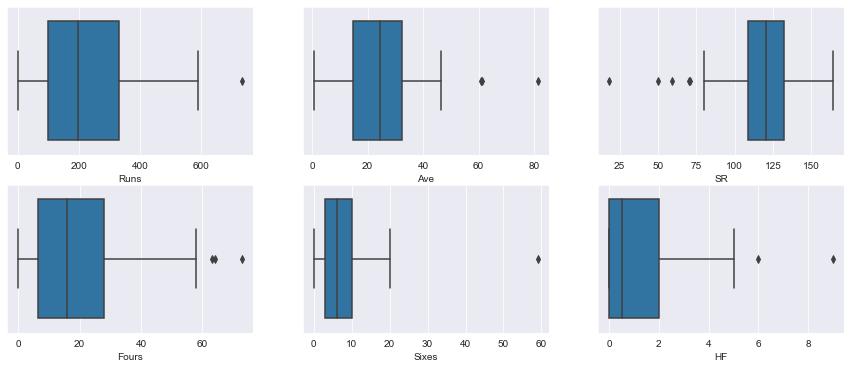

In [200]:
count=1
plt.subplots(figsize=(15, 6))
for col in p4data.columns[1:7]:
    plt.subplot(2,3,count)
    sns.boxplot(x=p4data[col])
    count+=1

plt.show()

In [201]:
#can observe outliers in data. NOrmalization of data would help in better prediction

In [202]:
df_1=p4data.sort_values(by='Runs',ascending=False) 

df_1.sort_values(by='HF',ascending=False).head(10) #people who scored more runs and have more HF

,Name,Runs,Ave,SR,Fours,Sixes,HF
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0
11,AM Rahane,560.0,40.00,129.33,73.0,10.0,5.0
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0
15,RG Sharma,433.0,30.92,126.60,39.0,18.0,5.0
25,F du Plessis,398.0,33.16,130.92,29.0,17.0,3.0
27,OA Shah,340.0,37.77,132.81,24.0,16.0,3.0
17,AB de Villiers,319.0,39.87,161.11,26.0,15.0,3.0


In [203]:
#Gayle and Gambhir have more half centuries than all players. Dhawan,Rahane,Sehwag and white.R sharma score equal HF

In [204]:
import plotly.express as px
fig = px.pie(df_1, values='Runs', names='Name') 
fig.show()

In [205]:
#Gayle, Gambhir and Dhawan are top run scorers Follwed by rahane,sehwag white and Dravid.

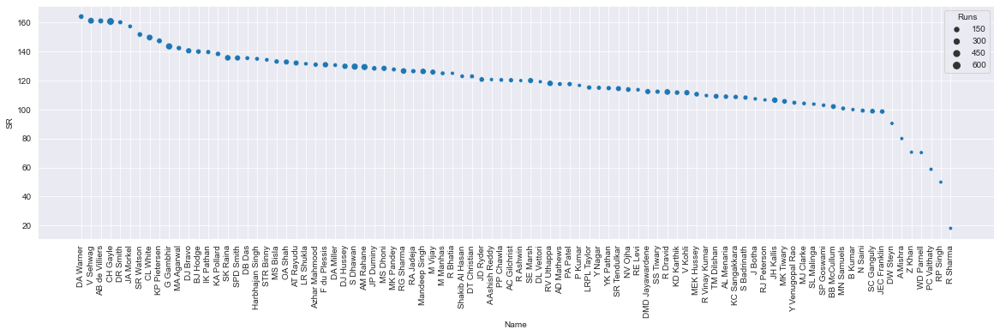

In [206]:
df_2=p4data.sort_values(by='SR',ascending=False)
fig, ax =plt.subplots(figsize=(20,5))
sns.scatterplot(y=df_2['SR'] , x=df_2['Name'],data=df_2,size=df_2['Runs'],ax=ax)
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.show()

In [207]:
#warner,sehwag,ABD,gayle and Smith are haivng high SR than others.we can see high run scoreers ahve diff SR. 

In [208]:
df_2=p4data.sort_values(by='Ave',ascending=False) 
df_2.head(10)

,Name,Runs,Ave,SR,Fours,Sixes,HF
19,JP Duminy,244.0,81.33,128.42,13.0,11.0,2.0
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
13,KP Pietersen,305.0,61.00,147.34,22.0,20.0,3.0
29,DJ Bravo,371.0,46.37,140.53,20.0,20.0,0.0
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0
23,SR Watson,255.0,42.50,151.78,26.0,14.0,2.0
77,DB Das,126.0,42.00,135.48,9.0,6.0,0.0
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0
45,SPD Smith,362.0,40.22,135.58,24.0,14.0,0.0
11,AM Rahane,560.0,40.00,129.33,73.0,10.0,5.0


In [209]:
fig = px.pie(df_2, values='Ave', names='Name') 
fig.show()

In [210]:
#Duminy,Gayle and Pitersen are having high averages

In [211]:
df_3=p4data.sort_values(by='Sixes',ascending=False) 
df_3=df_3.head(20)

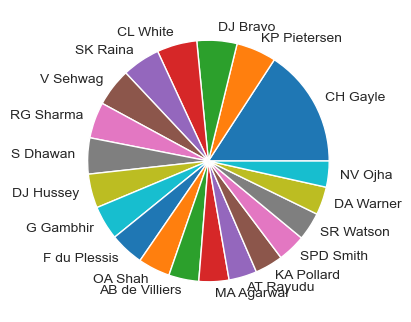

In [212]:
plt.figure(dpi = 100, figsize = (8,4))
plt.pie(df_3.Sixes,labels=df_3.Name)
plt.show()

In [213]:
#Gayle hits most number of sixes followed by pitersonBravo white and Raina

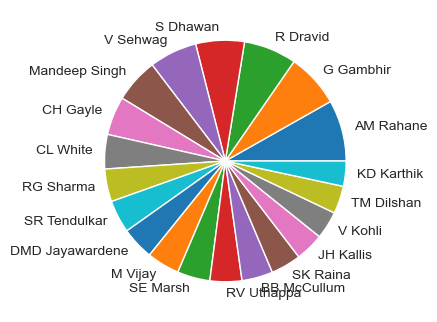

In [214]:
df_4=p4data.sort_values(by='Fours',ascending=False) 
df_4=df_4.head(20)
plt.figure(dpi = 100, figsize = (8,4))
plt.pie(df_4.Fours,labels=df_4.Name)
plt.show()

In [215]:
#Rahane hit most number of fours followed by gambhir,dravid,dhawan and sehwag

*== Joint plot of Runs with Other Variables ==* 

Correlation between Runs and Ave ==>  0.692984479098991


<Figure size 500x400 with 0 Axes>

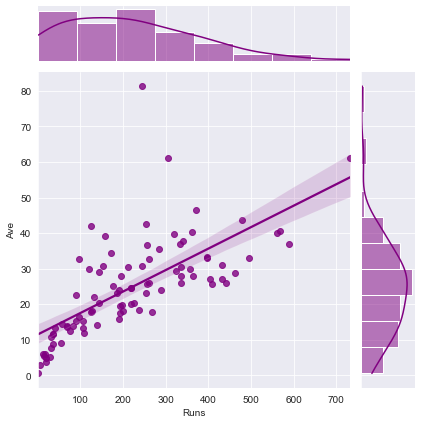

Correlation between Runs and SR ==>  0.49348865525774166


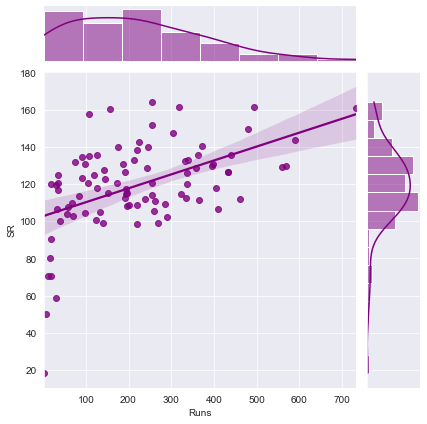

Correlation between Runs and Fours ==>  0.91880860633387


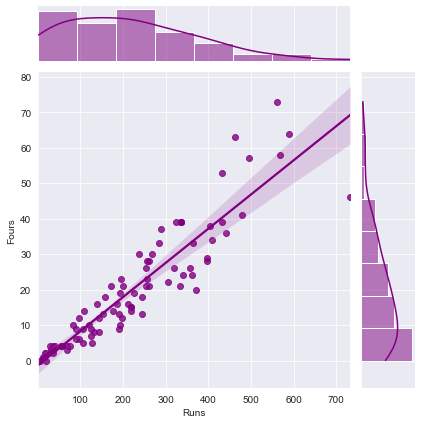

Correlation between Runs and Sixes ==>  0.7697775839180186


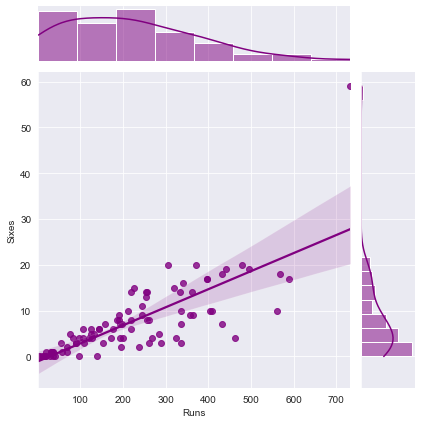

Correlation between Runs and HF ==>  0.835147736890667


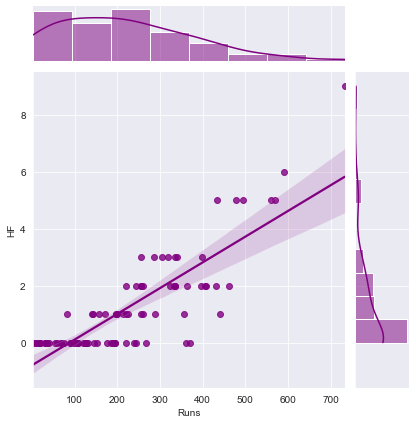

In [216]:
plt.figure(dpi = 100, figsize = (5,4))
print("*== Joint plot of Runs with Other Variables ==* \n")
for i in  p4data.columns:
    if i != 'Runs' and i != 'Name':
        print(f"Correlation between Runs and {i} ==> ",p4data.corr().loc['Runs'][i])
        sns.jointplot(x='Runs',y=i,data=p4data,kind = 'reg',color = 'purple')
        plt.show()

In [217]:
#We can observe runs are high postive correalted with Fours and HF.

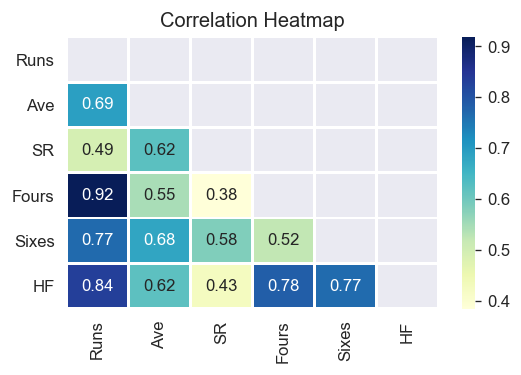

In [218]:
#correlation heatmap
sns.set_style('darkgrid')
plt.figure(dpi = 120,figsize= (5,3))
mask = np.triu(np.ones_like(p4data.corr(),dtype = bool))
sns.heatmap(p4data.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'YlGnBu')
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.title('Correlation Heatmap')
plt.show()

In [219]:
#as predicted from joint plot, Runs are highly correlating with Fours and HF
#Fours and Sixes have high correlatio with HF

<Figure size 600x600 with 0 Axes>

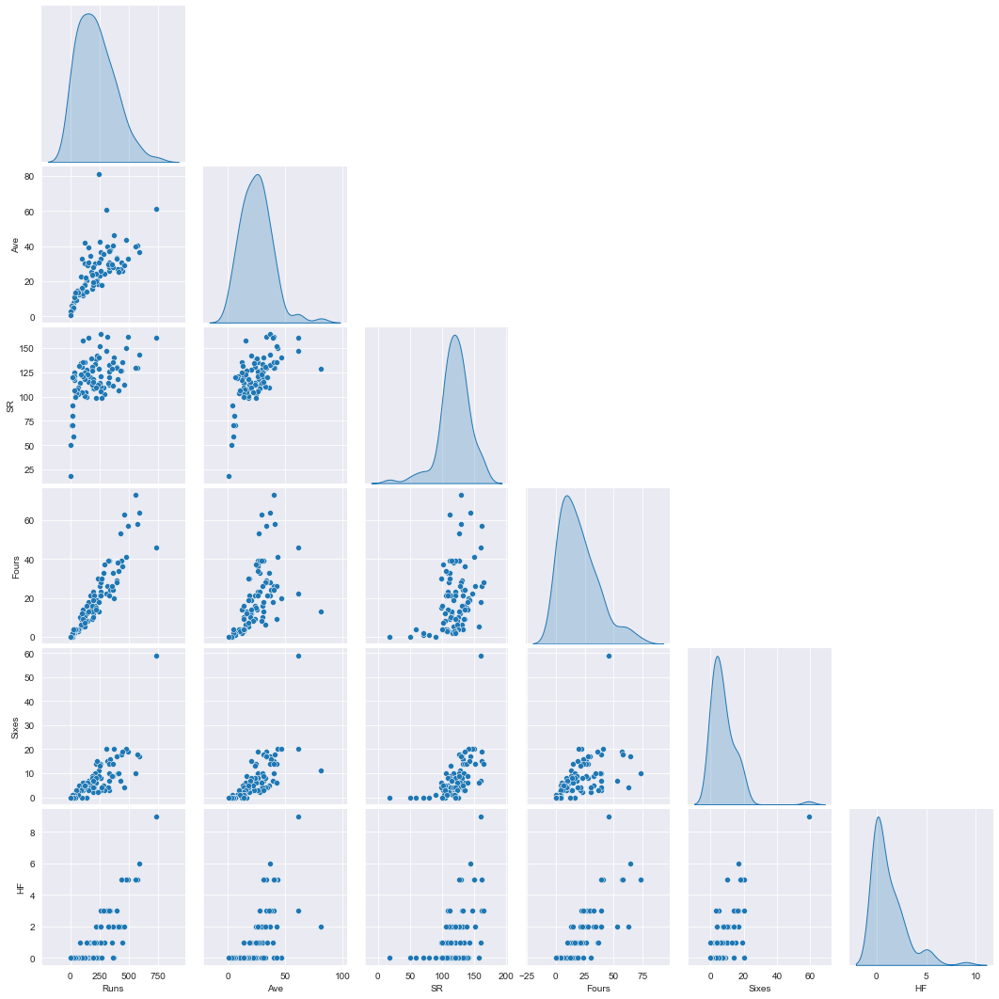

In [220]:
plt.figure(dpi=120,figsize= (5,5))
sns.pairplot(p4data,corner=True,diag_kind='kde')
plt.show()

In [221]:
p4data_new=p4data.drop(['Name'],axis=1)
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(p4data_new)
p4data_new = scaler.transform(p4data_new)

In [222]:
df5=pd.DataFrame(p4data_new)
df5.columns=p4data.columns[1:7]
df5.head(5)

,Runs,Ave,SR,Fours,Sixes,HF
0,3.301945,2.683984,1.767325,1.607207,6.462679,4.651551
1,2.381639,0.896390,1.036605,2.710928,1.184173,2.865038
2,1.770248,0.610640,1.788154,2.281703,1.435530,2.269533
3,1.667276,1.388883,1.297182,1.300618,1.561209,2.269533
4,2.246490,1.174755,0.444038,2.343021,1.309851,2.269533


In [226]:
#Dimensionality Reduction using PCA
# generating the covariance matrix and the eigen values for the PCA analysis
cov_matrix = np.cov(p4data_new.T) # the relevanat covariance matrix
pd.DataFrame(cov_matrix)

,0,1,2,3,4,5
0,1.011236,0.700771,0.499033,0.929132,0.778427,0.844531
1,0.700771,1.011236,0.630613,0.552349,0.690082,0.627728
2,0.499033,0.630613,1.011236,0.389134,0.590504,0.432388
3,0.929132,0.552349,0.389134,1.011236,0.528445,0.792494
4,0.778427,0.690082,0.590504,0.528445,1.011236,0.776322
5,0.844531,0.627728,0.432388,0.792494,0.776322,1.011236


In [227]:
pca = PCA(random_state=42)
pca.fit(p4data_new)

#generating the eigen values and the eigen vectors
#eigen vectors are the principal components and the corresponding eigen values which are the magnitudes of variance captured

# Eignen values
pca.explained_variance_

array([4.30252561, 0.83636692, 0.41665751, 0.32912443, 0.16567829,
       0.01706297])

In [228]:
# Eigen Vectors
pd.DataFrame(pca.components_)

,0,1,2,3,4,5
0,0.458261,0.397973,0.325384,0.405742,0.417335,0.432372
1,0.266432,-0.331118,-0.697803,0.473558,-0.179025,0.275932
2,-0.109779,0.005505,-0.450134,-0.508235,0.669426,0.280825
3,-0.005201,0.847363,-0.432750,-0.032523,-0.248782,-0.178118
4,0.458409,-0.101228,-0.118903,0.096769,0.394580,-0.774867
5,0.704836,-0.060637,0.056249,-0.585142,-0.357862,0.160962


In [229]:
total = []
k=1
for i in pca.explained_variance_ratio_*100:
    total.append(i)
    print('Variance explained by Principle Component',k,'is : {:.2f}%'.format(i))
    k=k+1

Variance explained by Principle Component 1 is : 70.91%
Variance explained by Principle Component 2 is : 13.78%
Variance explained by Principle Component 3 is : 6.87%
Variance explained by Principle Component 4 is : 5.42%
Variance explained by Principle Component 5 is : 2.73%
Variance explained by Principle Component 6 is : 0.28%


In [230]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)
var_cumu

array([0.70911996, 0.84696562, 0.91563695, 0.96988153, 0.99718777,
       1.        ])

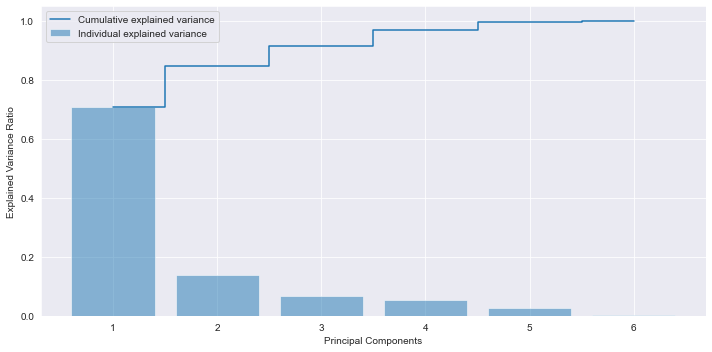

In [231]:
# Plotting the variance expalained by the principal components and the cumulative variance explained.
plt.figure(figsize=(10 , 5))
plt.bar(range(1, 7), pca.explained_variance_ratio_, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(1, 7), var_cumu, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

BY Taking 3 Prinicapl components we are covering 91%

In [232]:
pca_3 = PCA(n_components=3)  #specifying 3 PC components
pca_3.fit(p4data_new)

PCA(n_components=3)

In [233]:
# Eigen Vectors
e_vec=pd.DataFrame(pca_3.components_).T
e_vec

,0,1,2
0,0.458261,0.266432,-0.109779
1,0.397973,-0.331118,0.005505
2,0.325384,-0.697803,-0.450134
3,0.405742,0.473558,-0.508235
4,0.417335,-0.179025,0.669426
5,0.432372,0.275932,0.280825


In [234]:
# Eigen Values 
e_val=pca_3.explained_variance_
e_val

array([4.30252561, 0.83636692, 0.41665751])

In [235]:
sum(pca_3.explained_variance_ratio_*100)

91.56369501399475

In [236]:
#pd.DataFrame(pca_3.components_ * pca_3.explained_variance_)
mult_df=e_vec*e_val
mult_df

,0,1,2
0,1.971679,0.222835,-0.045740
1,1.712290,-0.276936,0.002294
2,1.399972,-0.583620,-0.187552
3,1.745714,0.396068,-0.211760
4,1.795593,-0.149730,0.278921
5,1.860291,0.230781,0.117008


In [237]:
print("sum of PC1 is ",sum(mult_df[0]))
print("sum of PC2 is ",sum(mult_df[1]))
print("sum of PC3 is ",sum(mult_df[2]))

sum of PC1 is  10.48553783318705
sum of PC2 is  -0.16060174139969396
sum of PC3 is  -0.04682944017186251


In [238]:
#we can observe Runs are having high magnitude that drives the direction

In [239]:
runs_sorted=p4data.sort_values(by='Runs',ascending=False) 
runs_sorted.reset_index(drop=True, inplace=True)
runs_sorted.insert(7,'Rank', runs_sorted.index + 1)

In [240]:
runs_sorted.head(5)

,Name,Runs,Ave,SR,Fours,Sixes,HF,Rank
0,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,1
1,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,2
2,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,3
3,AM Rahane,560.0,40.00,129.33,73.0,10.0,5.0,4
4,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,5


Assinged ranks to all players based on Runs

# PART 5

Dimensionality Reduction techniques:
    -> if we have too much missing values ratio then those can dropped instead of imputing. As lot of data is missed these will        not make any difference to prediction
    -> if the varaibles are correlating with each other highly then those can be dropped 
    -> with forward feature selection, we start with few columns and adding other columns wrt performance 
    -> with backward feature elimination, we start with all columns and reducing each wrt performance
    -> Feature importance can be choosen by random forest and can ignore columns with less weight

!pip install Pillow

In [256]:
from PIL import Image
# load the image
image = Image.open('C:\\Users\\ascd0\\Downloads\lotus.jpg')
# summarize some details about the image
print(image.format)
print(image.mode)
print(image.size)
# show the image
image.show()

JPEG
RGB
(1000, 1080)


In [257]:
from numpy import asarray

# convert image to numpy array
data = asarray(image)
# summarize shape
print(data.shape)
# create Pillow image
image2 = Image.fromarray(data)
# summarize image details
print(image2.format)
print(image2.mode)
print(image2.size)

(1080, 1000, 3)
None
RGB
(1000, 1080)


In [258]:
#from shape we can observe image is of 3 dimensions

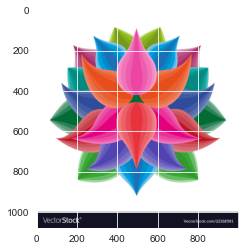

In [259]:
plt.imshow(image)

In [260]:
#reshaping image from 3D to 2D
from skimage import io, color
image_gray = color.rgb2gray(data)
print('shape of gray image',image_gray.shape)

shape of gray image (1080, 1000)


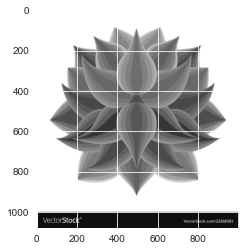

In [261]:
plt.imshow(image_gray,cmap = plt.cm.gray)

Number of components explaining 95% variance: 7


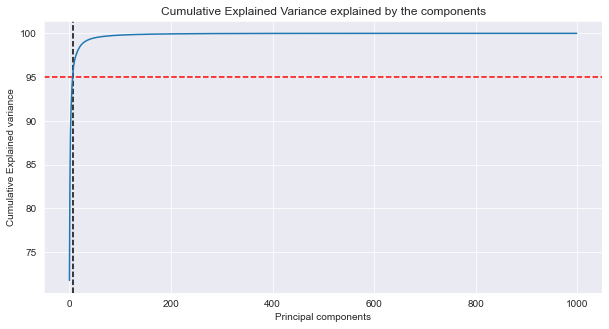

In [262]:
pca = PCA()
pca.fit(image_gray)

# Getting the cumulative variance

var_cumu = np.cumsum(pca.explained_variance_ratio_)*100

# How many PCs explain 95% of the variance?
k = np.argmax(var_cumu>95)
print("Number of components explaining 95% variance: "+ str(k))
#print("\n")

plt.figure(figsize=[10,5])
plt.title('Cumulative Explained Variance explained by the components')
plt.ylabel('Cumulative Explained variance')
plt.xlabel('Principal components')
plt.axvline(x=k, color="k", linestyle="--")
plt.axhline(y=95, color="r", linestyle="--")
ax = plt.plot(var_cumu)

In [250]:
#from above we can understand 7 components alone can explain 95% accuracy

Reconstructing the b/w image with the limited number of components (7)
First, we will use the fit_transform method from the IncrementalPCA module to first find the 7 PCs and transform and represent the data in those 7 new components/columns.
Next, we will reconstruct the original matrix from these 7 components using the inverse_transform method.
We will then plot the image to visually assess the quality of it.

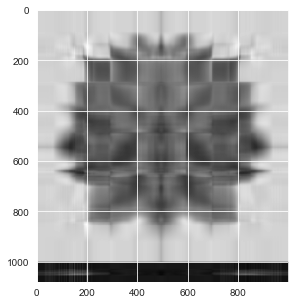

In [263]:
from sklearn.decomposition import IncrementalPCA
pca7 = IncrementalPCA(n_components=7)
image_7 = pca7.inverse_transform(pca7.fit_transform(image_gray))

# Plotting the reconstructed image
plt.figure(figsize=[8,5])
plt.imshow(image_7,cmap = plt.cm.gray)

In [264]:
#quality has been reduced lot with 7 components

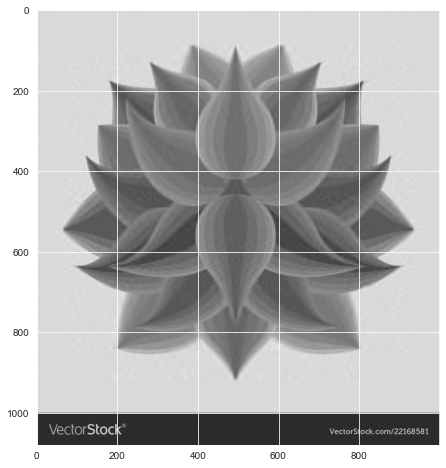

In [265]:
# Function to reconstruct and plot image for a given number of components

def plot_at_k(k):
    ipca = IncrementalPCA(n_components=k)
    image_recon = ipca.inverse_transform(ipca.fit_transform(image_gray))
    plt.imshow(image_recon,cmap = plt.cm.gray)
    

k = 50
plt.figure(figsize=[12,8])
plot_at_k(k)

In [254]:
#image quality is better with 50 components

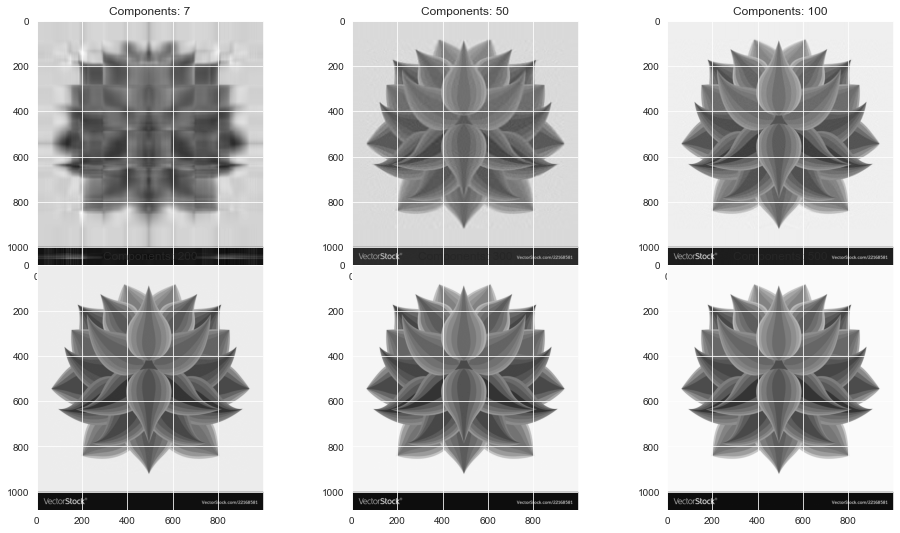

In [268]:
list = [7, 50, 100, 200, 300, 500]

plt.figure(figsize=[16,9])

for i in range(6):
    plt.subplot(2,3,i+1)
    plot_at_k(list[i])
    plt.title("Components: "+str(list[i]))

plt.subplots_adjust(wspace=0.2, hspace=0.0)
plt.show()

#image quality has increased more with 100 components...Clarity has nt been degraded with 200 components onwards

PCA can be applied on multimedia images as well.we can choose the components that are giving high accuracy and reduce the dimensions.